# Load packages, data, and models

In [1]:
import pickle
import train
import build_features
import numpy as np
import pandas as pd
import time
import os
import zscore
from scipy import stats
import matplotlib.pyplot as plt
from sklearn import metrics
from dateutil.relativedelta import relativedelta
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

/Volumes/CPO/ObesityPY/src/train.py:12: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/Users/hammor01/anaconda3/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/Users/hammor01/anaconda3/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/Users/hammor01/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/Users/hammor01/anaconda3/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/Users/hammor01/anaconda3/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 486, in start
    self.io_loop.start

In [2]:
d1 = pickle.load(open('../python objects/patientdata_20170823.pkl', 'rb'))

maternal = np.load('../outputs_age_analyses20180221/maternal_24months.npz')
x1 = maternal['x']
y1 = maternal['y']
y1label = maternal['ylabel']
mrns = maternal['mrns']
feature_headers = maternal['features']

g_wfl = np.loadtxt('../auxdata/WHO_wfl_girls_p_exp.txt', delimiter='\t')
b_wfl = np.loadtxt('../auxdata/WHO_wfl_boys_p_exp.txt', delimiter='\t')

boys_maternal_no_exclusion = np.load('../outputs_age_analyses20180221/data_transformed_randomforest_boys_maternal_no_exclusion_24_months.npz')
girls_maternal_no_exclusion = np.load('../outputs_age_analyses20180221/data_transformed_randomforest_girls_maternal_no_exclusion_24_months.npz')
arrays = [boys_maternal_no_exclusion, girls_maternal_no_exclusion]

# data_transformed dictionary keys
# x=x2, mrns=mrns2, features=np.array(feature_headers2), y=y2, ylabel=y2label,
# ix2=ix_filter, modeling_ix=randix, train_ix=ix_train, test_ix=ix_test
ix = [[arr['ix2'], arr['modeling_ix'], arr['train_ix'], arr['test_ix']] for arr in arrays]
test_sets = {'boys_maternal_no_exclusion': [boys_maternal_no_exclusion['x'][ix[0][1]][ix[0][3]], 
                                        boys_maternal_no_exclusion['y'][ix[0][1]][ix[0][3]], 
                                        y1label[ix[0][0]][ix[0][1]][ix[0][3]], 
                                        mrns[ix[0][0]][ix[0][1]][ix[0][3]],
                                        x1[ix[0][0]][ix[0][1]][ix[0][3]],
                                        1.775, 'boys maternal w/o exclusions - model: randomforest@ 24months'],

         'girls_maternal_no_exclusion': [girls_maternal_no_exclusion['x'][ix[1][1]][ix[1][3]], 
                                         girls_maternal_no_exclusion['y'][ix[1][1]][ix[1][3]], 
                                         y1label[ix[1][0]][ix[1][1]][ix[1][3]], 
                                         mrns[ix[1][0]][ix[1][1]][ix[1][3]],
                                         x1[ix[1][0]][ix[1][1]][ix[1][3]],
                                         1.603, 'girls maternal w/o exclusions - model: randomforest@ 24months']
            }

boys_mrns = mrns[ix[0][0]]
girls_mrns = mrns[ix[1][0]]
print(boys_mrns.shape, girls_mrns.shape)

(2474,) (2456,)


# Updates to Machine Learning for Pediatric Obesity

### 08 March 2018

# Accomplished since last meeting
<ul>
    <li>Another 1900 addresses were able to be geocoded</li>
    <li>Relative coordinates were converted to x,y pairs and a model ready data set was created</li>
    <li>Progressive time models completed</li>
    <li>High risk kids (9 boys and 7 girls) from the sample models were extracted for to get their growth curves</li>
    <li>Sample figures for the paper are created</li>
    <li>A function to create table outputs for summary statistics of key features is created</li>
    <li>Acuracy comparisons for the best models compared to Mary Jo's original and updated inclusion criteria</li>
</ul>

## Get all of the bmi percentiles for boys and girls between 4.5 and 5.5 years and bin them

In [3]:
agex_low = 4.5
agex_high = 5.5
mrns_list = []
outcome = []
outcomelabels = []
genders = []

for k in d1.keys():
    if str(d1[k]['mrn']) not in boys_mrns.tolist() + girls_mrns.tolist():
        continue
    bdate = d1[k]['bdate']
    mrns_list.append(d1[k]['mrn'])
    genders.append(d1[k]['gender'])
    if ('vitals' in d1[k]) and ('BMI' in d1[k]['vitals']):
        BMI_list = []
        BMI_outcome_list = []
        for (edate, bmi) in d1[k]['vitals']['BMI']:
            age = (edate - bdate).days / 365.0
            diff = relativedelta(edate, bdate)
            age_mos = 12*diff.years + diff.months + diff.days/30
            age_yrs= diff.years + (diff.months + diff.days/30)/12
            if (age_yrs >= agex_low) and (age_yrs < agex_high):
                BMI_list.append(bmi)
                #stats.norm.cdf to go from zscore to percentile
                #stats.norm.ppf to go from percentile to zscore
                BMI_outcome_list.append(stats.norm.cdf(zscore.zscore_bmi(d1[k]['gender'], age_mos, bmi)))
        if len(BMI_list) >= 1:
            outcomelabels.append(np.array(BMI_outcome_list).mean())
            outcome.append(np.array(BMI_list).mean())
    else:
        outcome.append(0.)
        outcomelabels(0.)
        
boys=[o for g,o in zip(genders,outcomelabels) if g == 0]
girls=[o for g,o in zip(genders,outcomelabels) if g == 1]
len(boys), len(girls)

bins = [0.001,0.01,0.03,0.05,0.10,0.15,0.25,0.50,0.75,0.85,0.90,0.95,0.97,0.99,0.999,1.]
bin_names = ['0.0 - 0.001','0.001 - 0.01','0.01 - 0.03','0.03 - 0.05','0.05 - 0.1','0.1 - 0.15'
             ,'0.15 - 0.25','0.25 - 0.5','0.5 - 0.75','0.75 - 0.85','0.85 - 0.9','0.9 - 0.95',
             '0.95 - 0.97','0.97 - 0.99','0.99 - 0.999','0.999 - 1.0']

# bin_names = ['0 - 0.1','0.1 - 1','1 - 3','3 - 5','5 - 10','10 - 15'
#              ,'15 - 25','25 - 50','50 - 75','75 - 85','85 - 90','90 - 95',
#              '95 - 97','97 - 99','99 - 99.9','99.9 - 100']

boys_bins = np.bincount(np.digitize(boys, bins, right=False))
girls_bins = np.bincount(np.digitize(girls, bins, right=False))
print(bins)
print(boys_bins)
print(girls_bins)

[0.001, 0.01, 0.03, 0.05, 0.1, 0.15, 0.25, 0.5, 0.75, 0.85, 0.9, 0.95, 0.97, 0.99, 0.999, 1.0]
[  2   8  18  14  40  57 103 383 586 340 178 244 103 170 149  79]
[  6   7  23  20  35  46 114 424 644 361 204 222 114 135  98   3]


# BMI Percentile Distribution for All Children in the Cohort

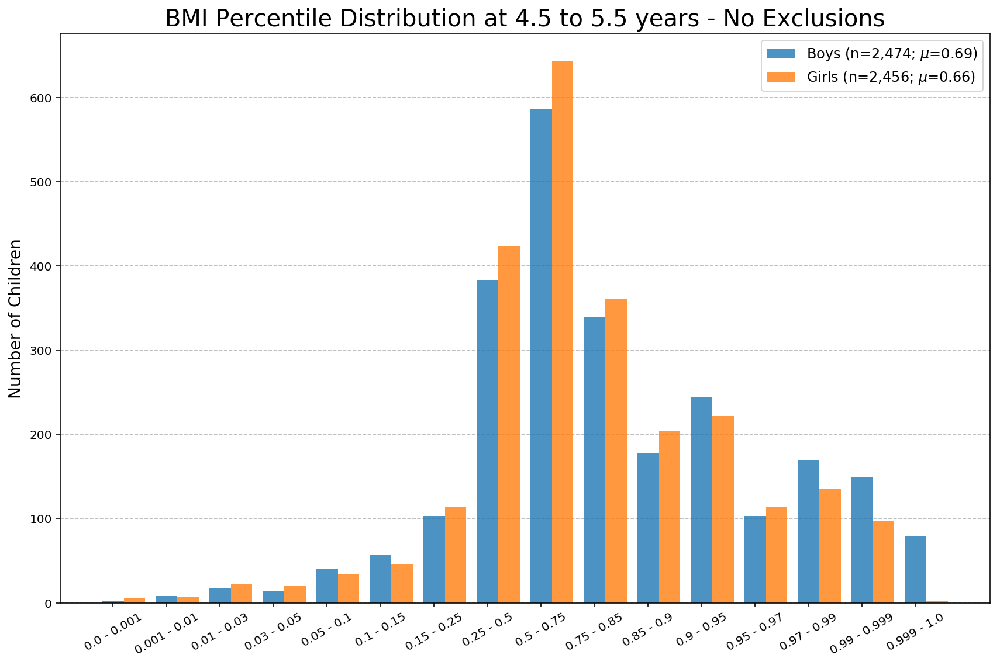

In [4]:
fig, ax = plt.subplots(figsize=(12,8))
index = np.arange(len(bins))
bar_width = 0.4
opacity = 0.8

bar1 = plt.bar(index, boys_bins, bar_width, alpha=opacity,
               label='Boys (n={0:,.0f}; $\mu$={1:,.2f})'.format(np.sum(boys_bins), np.mean(boys)))
 
bar2 = plt.bar(index + bar_width, girls_bins, bar_width, alpha=opacity,
               label='Girls (n={0:,.0f}; $\mu$={1:,.2f})'.format(np.sum(girls_bins), np.mean(girls)))

# plt.xlabel('Obesity Percentiles', fontsize=14)
plt.ylabel('Number of Children', fontsize=14)
plt.title('BMI Percentile Distribution at 4.5 to 5.5 years - No Exclusions', fontsize=20)
# plt.xticks(index + bar_width, ['{0:.1f}%'.format(b * 100) for b in bins])
plt.xticks(index, bin_names, rotation=30)
ax.yaxis.grid(linestyle='--')
ax.set_axisbelow(True)
plt.legend(fontsize=12)
 
plt.tight_layout()
# plt.savefig('../outputs_age_analyses20180221/no_exclusions_bmi_percentiles.png', dpi=96)
plt.show()

## Get the high risk kids for randomforests without exclusions

In [5]:
titles_total = pickle.load(open('../outputs_age_analyses20180221/titles_total.pkl', 'rb'))
model_list = pickle.load(open('../outputs_age_analyses20180221/model_list.pkl', 'rb'))

for k,ts in test_sets.items():
    xtest = ts[0]
    ytest = ts[1]
    ytestlabel = ts[2]
    mrnstest = ts[3]
    t = ts[5]
    title = ts[6]
 
    model = model_list[titles_total.index(title)]
    test_sets[k].append(model.predict(xtest))
    print((test_sets[k][7] > t).ravel().sum())
    
N = np.sum((test_sets[k][7] > test_sets[k][5]).ravel().sum() for k in test_sets.keys())
highrisk = np.zeros((N, x1.shape[1]+1))
highrisk_y = np.zeros((N, 2))
sums = 0
for k,ts in test_sets.items():
    xtest = ts[0]
    ytestlabel = ts[2]
    mrnstest = ts[3]
    x = ts[4]
    t = ts[5]
    ytestpred = ts[7]
    hr = (ytestpred > t)
    highrisk[sums:sums+hr.sum(),:] = np.hstack((mrnstest[hr].reshape(-1,1).astype(int), x[hr].astype(float)))
    highrisk_y[sums:sums+hr.sum(),:] = np.hstack((mrnstest[hr].reshape(-1,1).astype(int), ytestlabel[hr].reshape(-1,1).astype(int)))
    sums+=hr.sum()

df = pd.DataFrame(highrisk, columns=['mrns']+list(feature_headers))
df_y = pd.DataFrame(highrisk_y, columns=['mrns','obese'])
df = df.drop_duplicates(subset='mrns', keep='first')
df_y = df_y.drop_duplicates(subset='mrns', keep='first')
df.mrns = df.mrns.astype(int)
df_y.mrns = df_y.mrns.astype(int)

keys = []
for k in d1.keys():
    if d1[k]['mrn'] in df_y.mrns.values:
        keys.append(k)

# df_y

9
7


/Users/hammor01/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:41: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


## Growth Curves for the 16 Highest Risk Kids in the Data Set

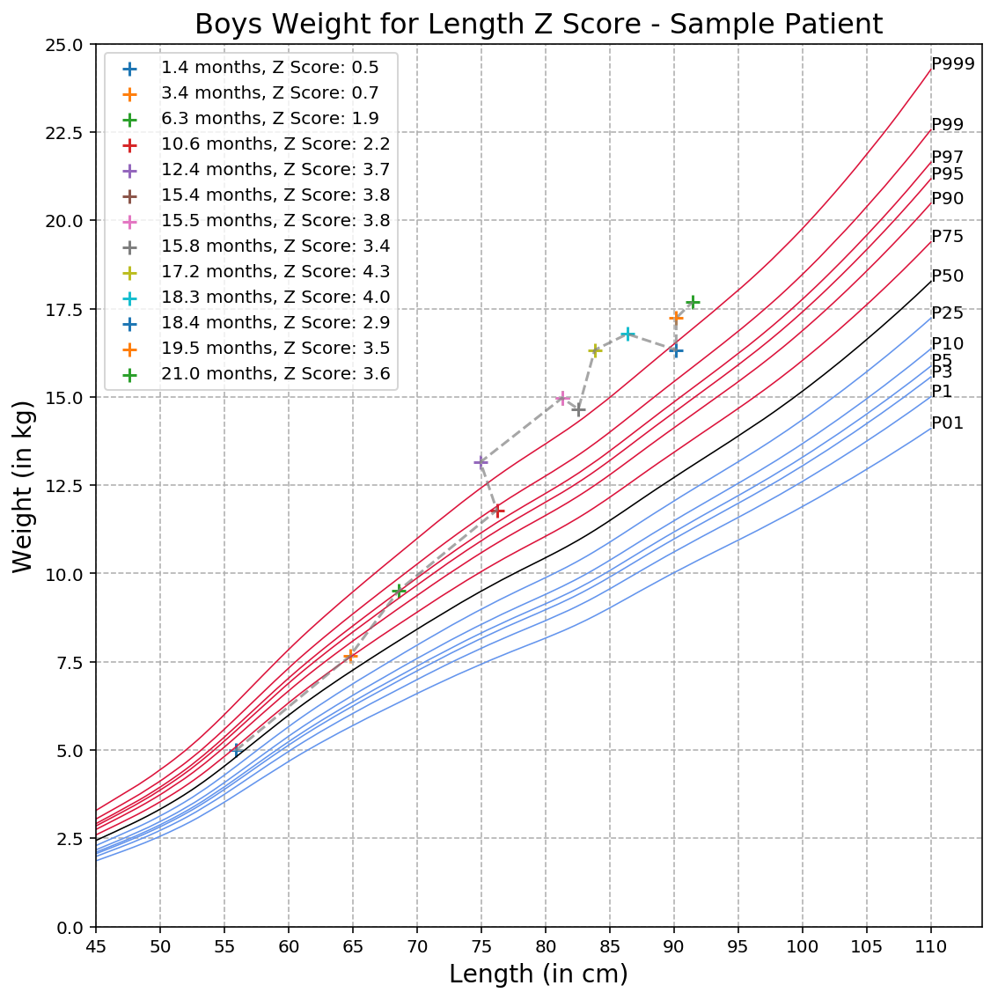

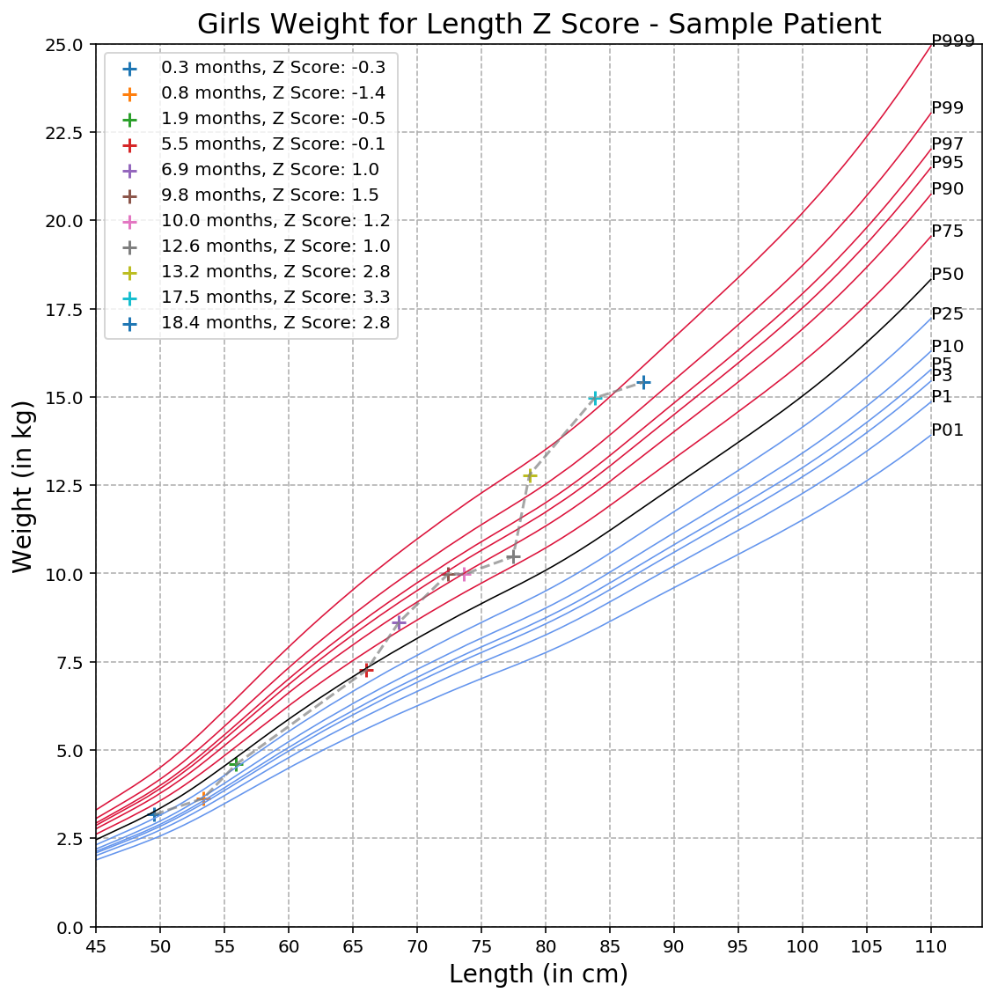

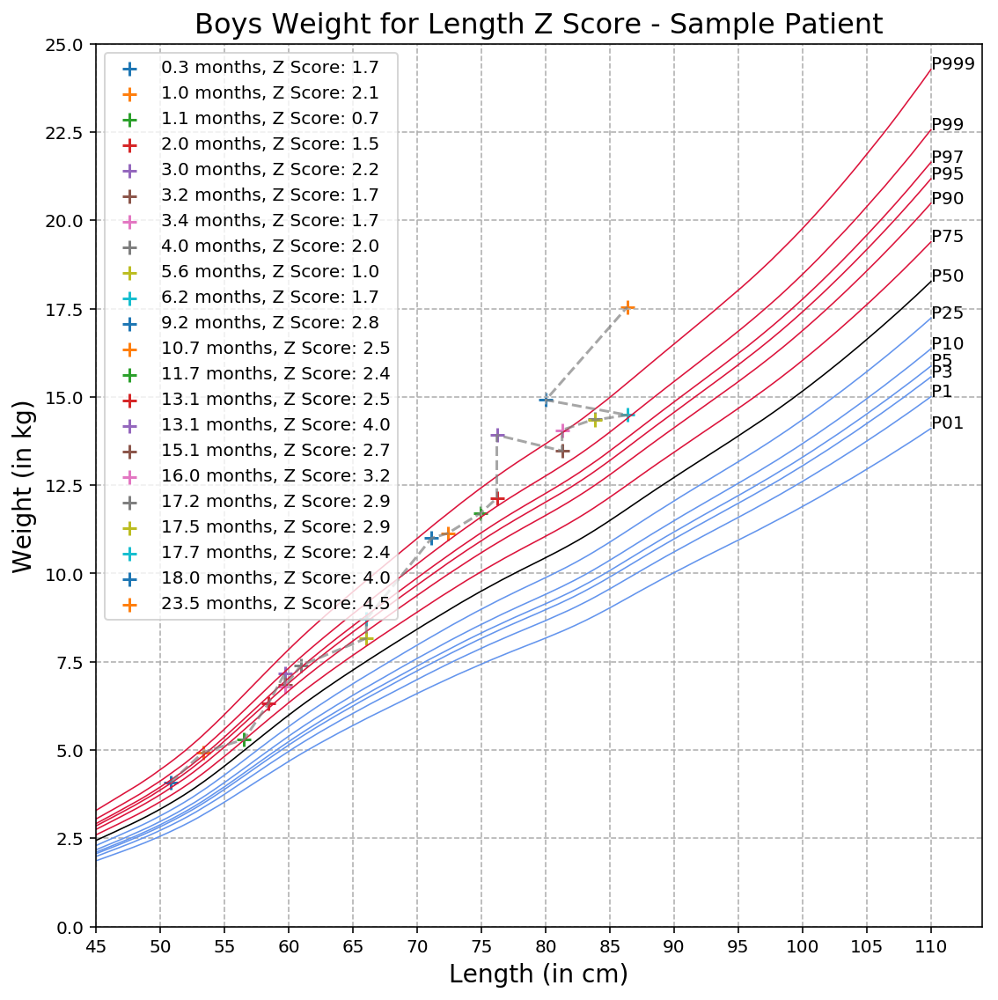

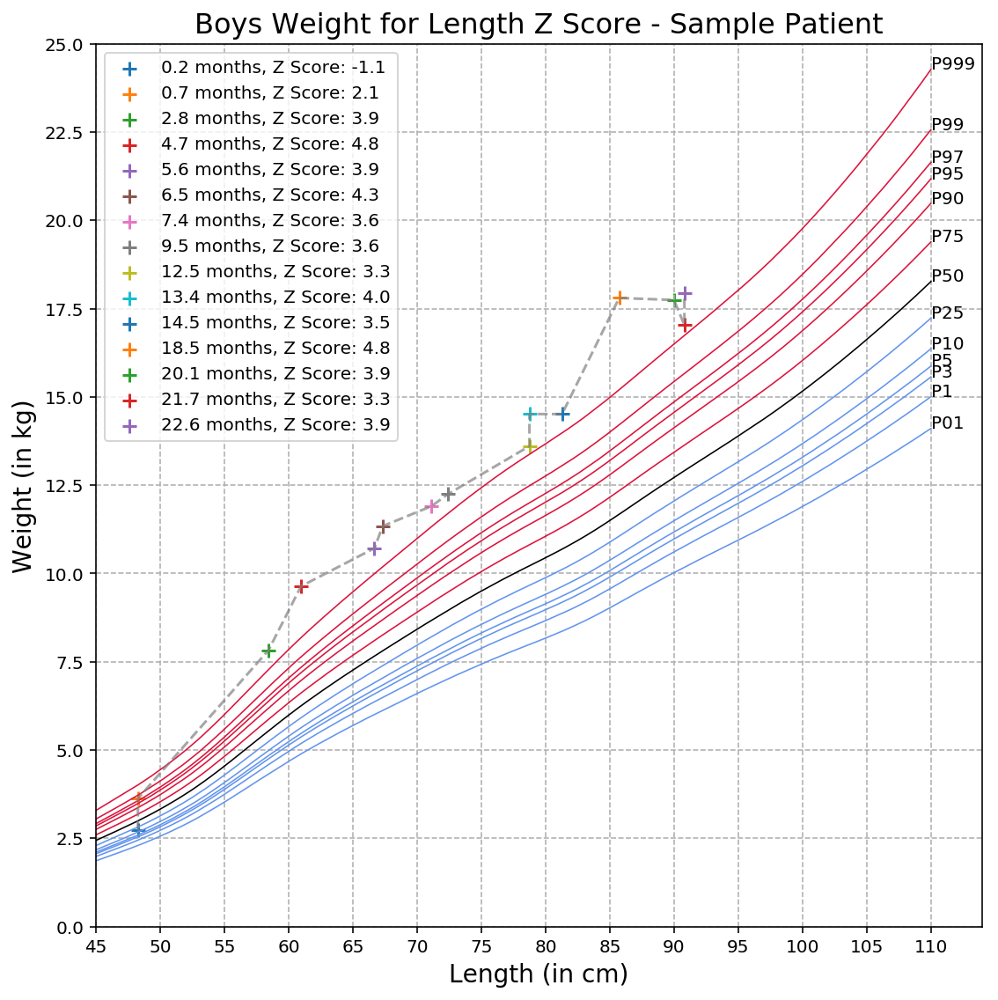

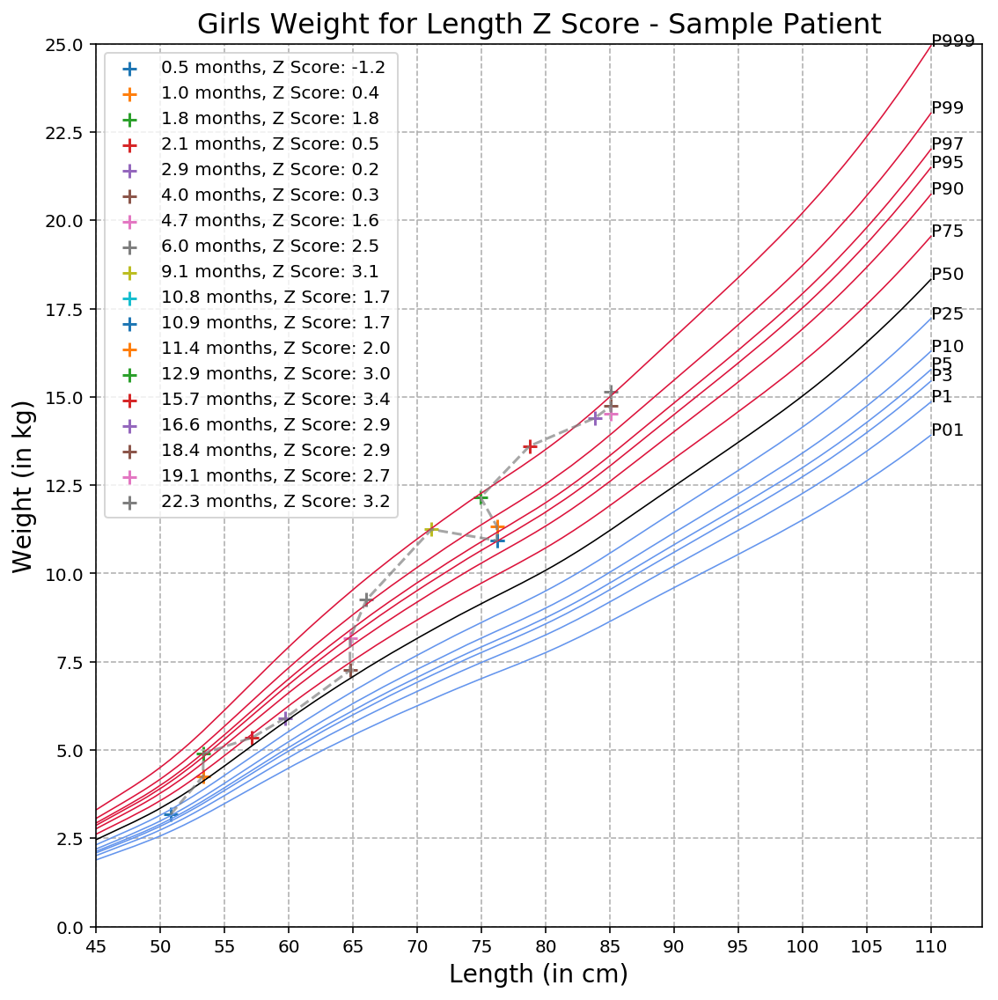

...

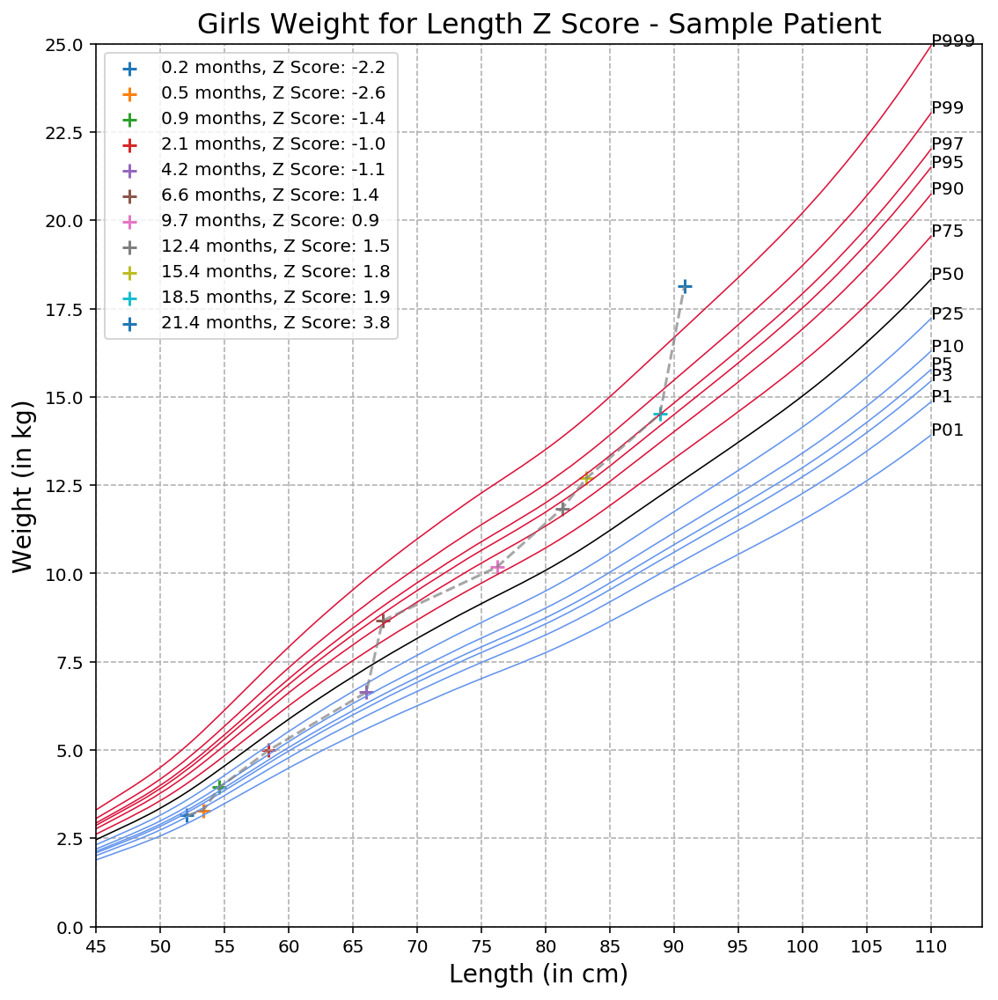

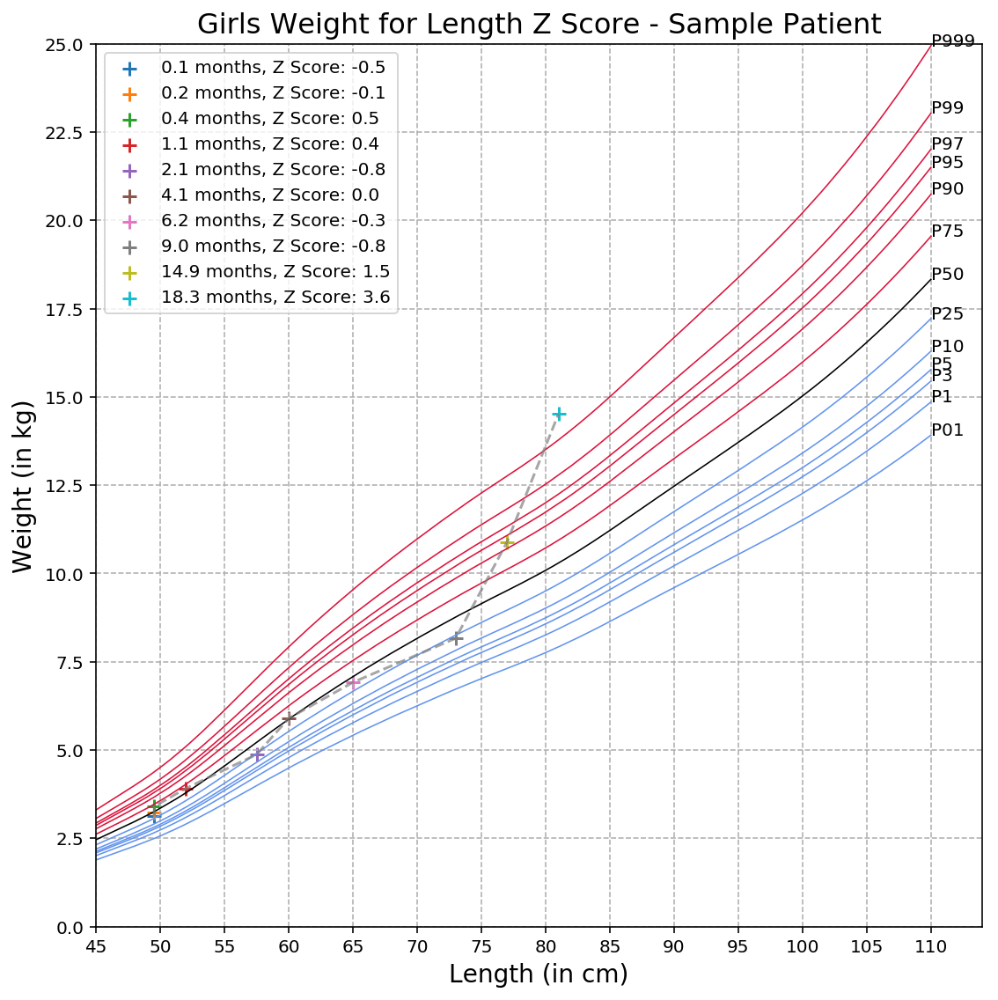

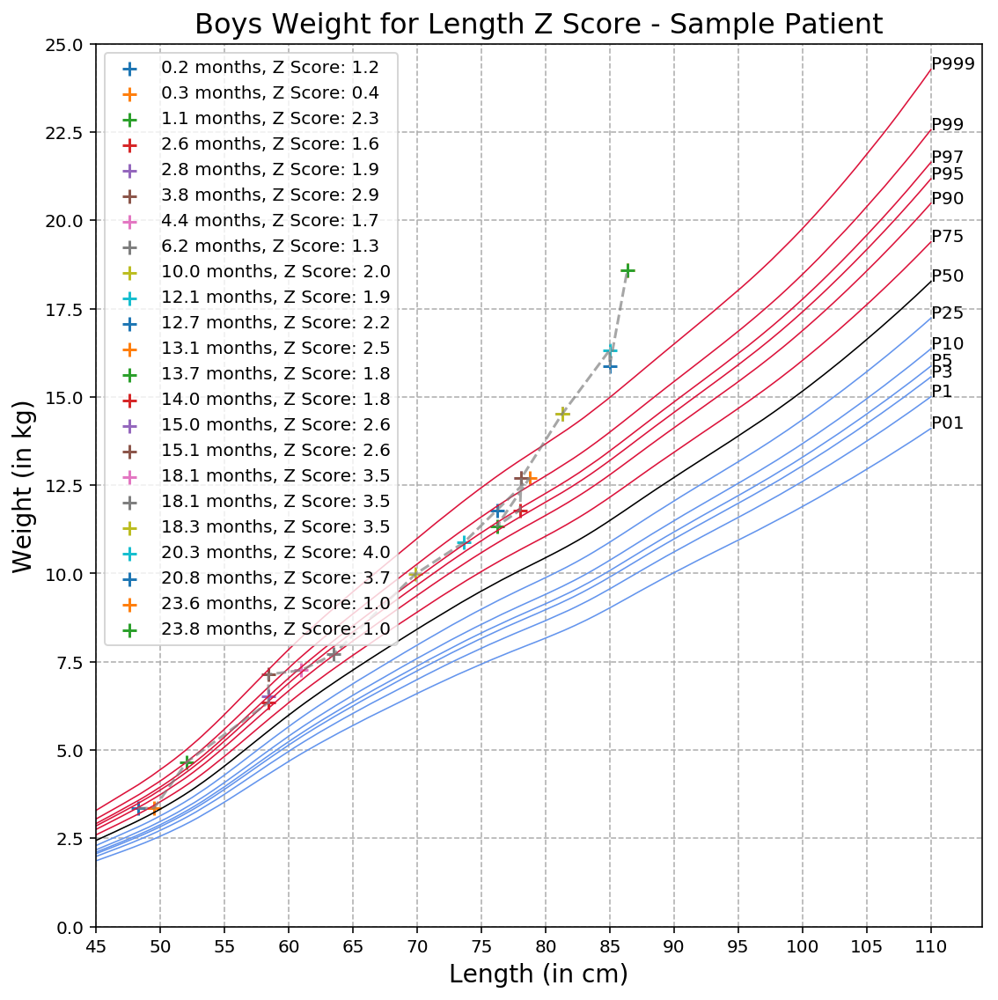

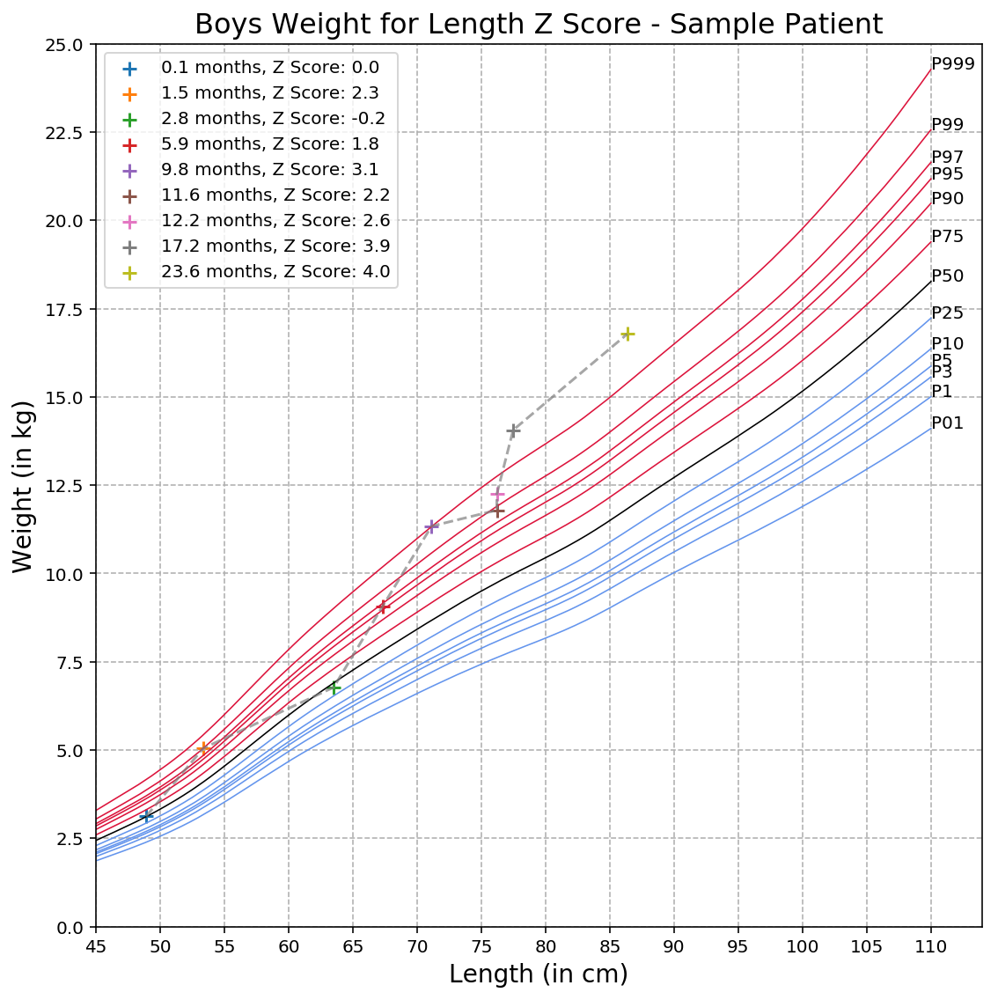

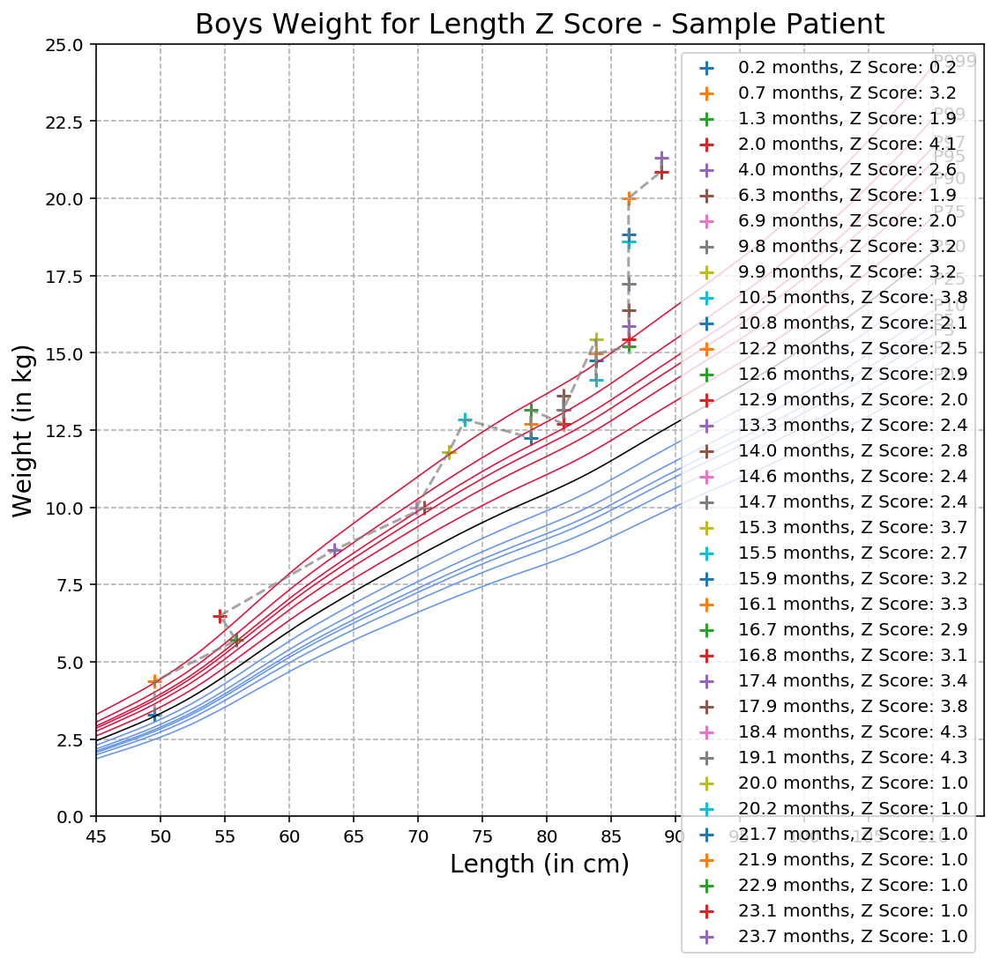

In [8]:
for k in keys:
    mrn = d1[k]['mrn']
#     fname = '../outputs_age_analyses20180221/growth_curve_'+str(mrn)+'.png'
    train.plot_growth_curve(d1,None,k, hide_mrn=True)

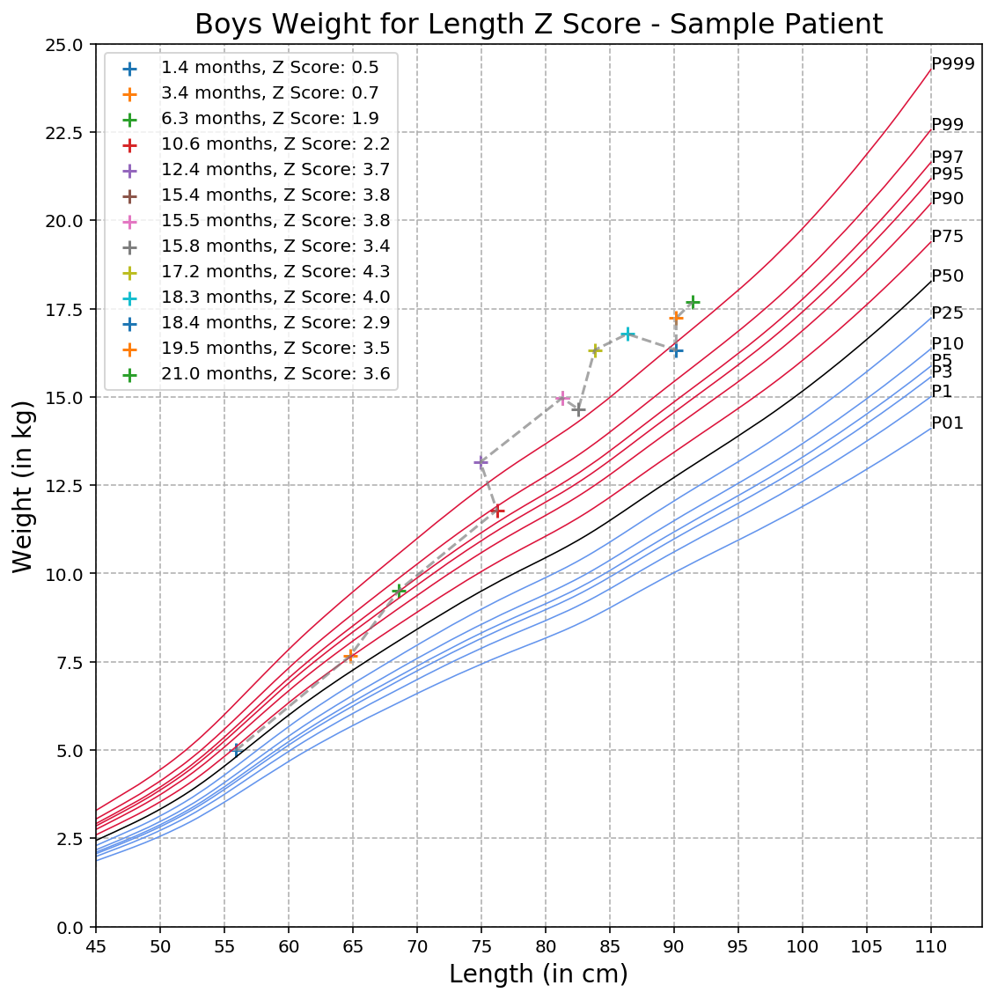

In [9]:
train.plot_growth_curve(d1,None,keys[0], hide_mrn=True)

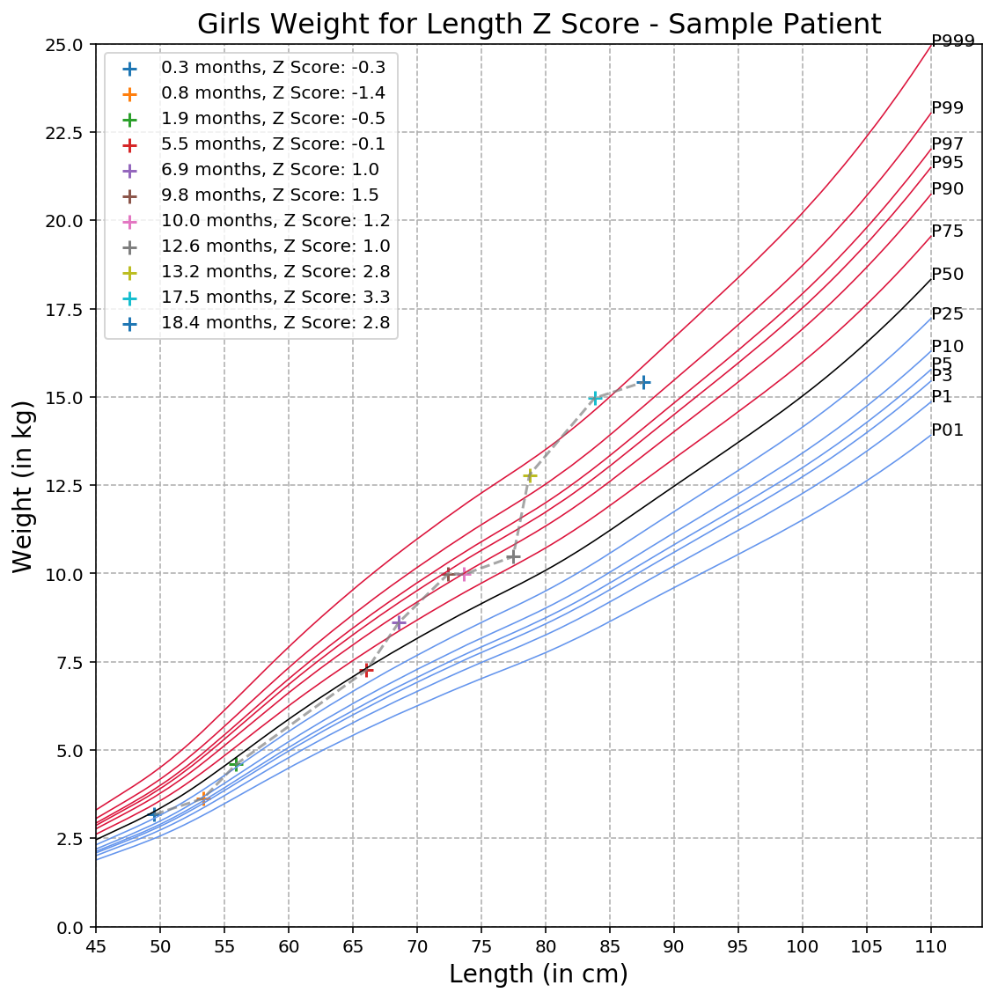

In [10]:
train.plot_growth_curve(d1,None,keys[1], hide_mrn=True)

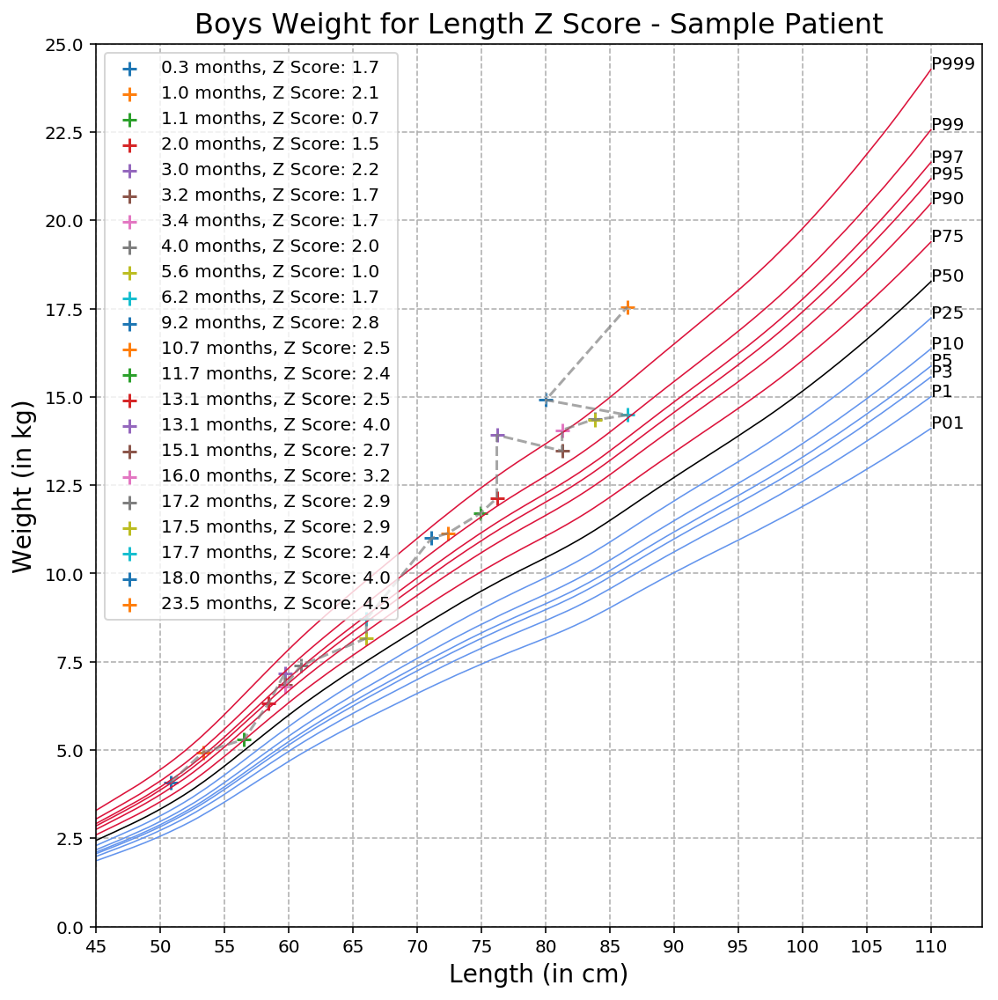

In [11]:
train.plot_growth_curve(d1,None,keys[2], hide_mrn=True)

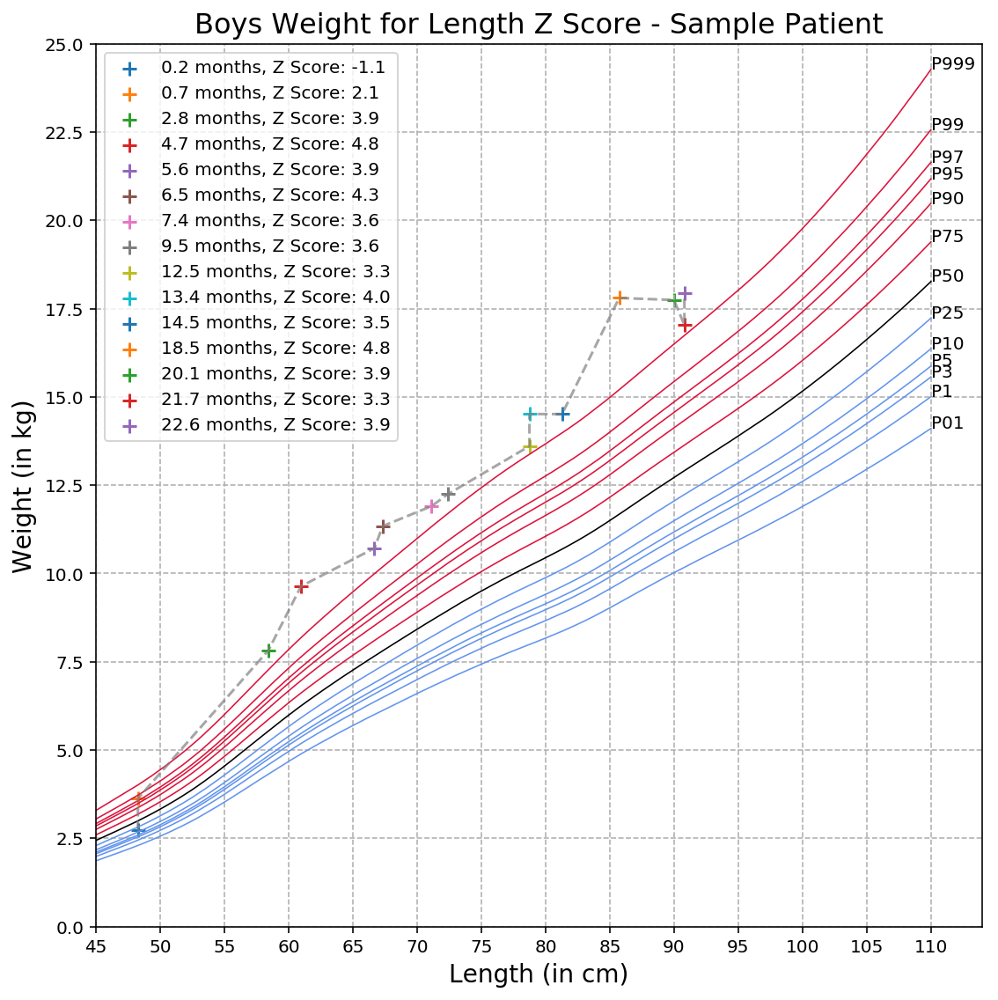

In [12]:
train.plot_growth_curve(d1,None,keys[3], hide_mrn=True)

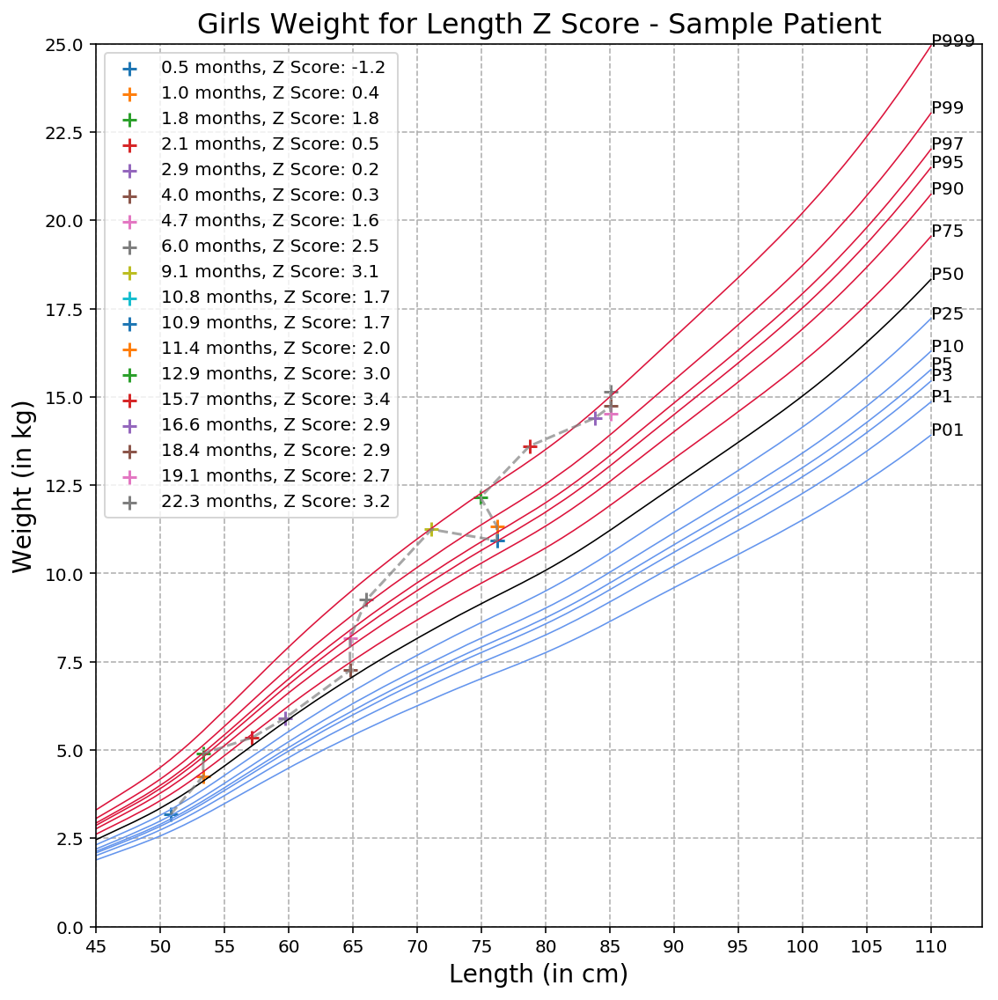

In [13]:
train.plot_growth_curve(d1,None,keys[4], hide_mrn=True)

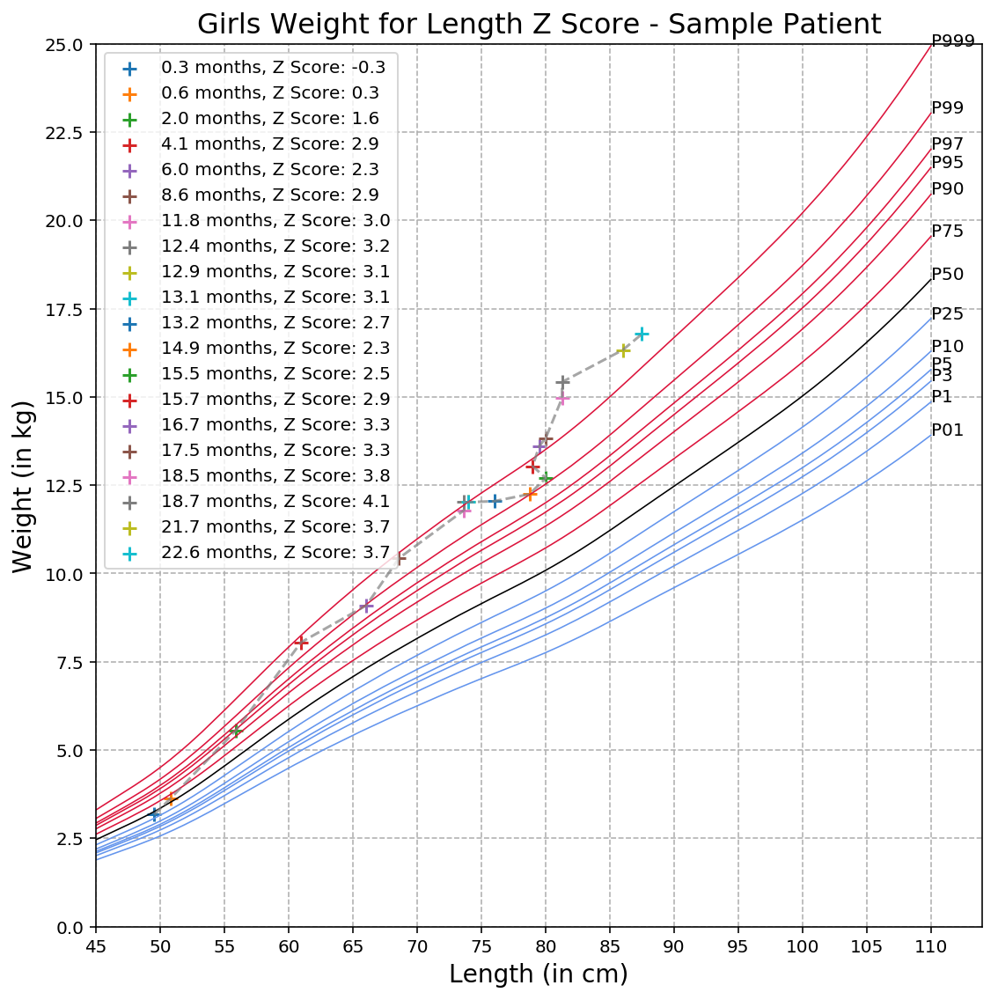

In [14]:
train.plot_growth_curve(d1,None,keys[5], hide_mrn=True)

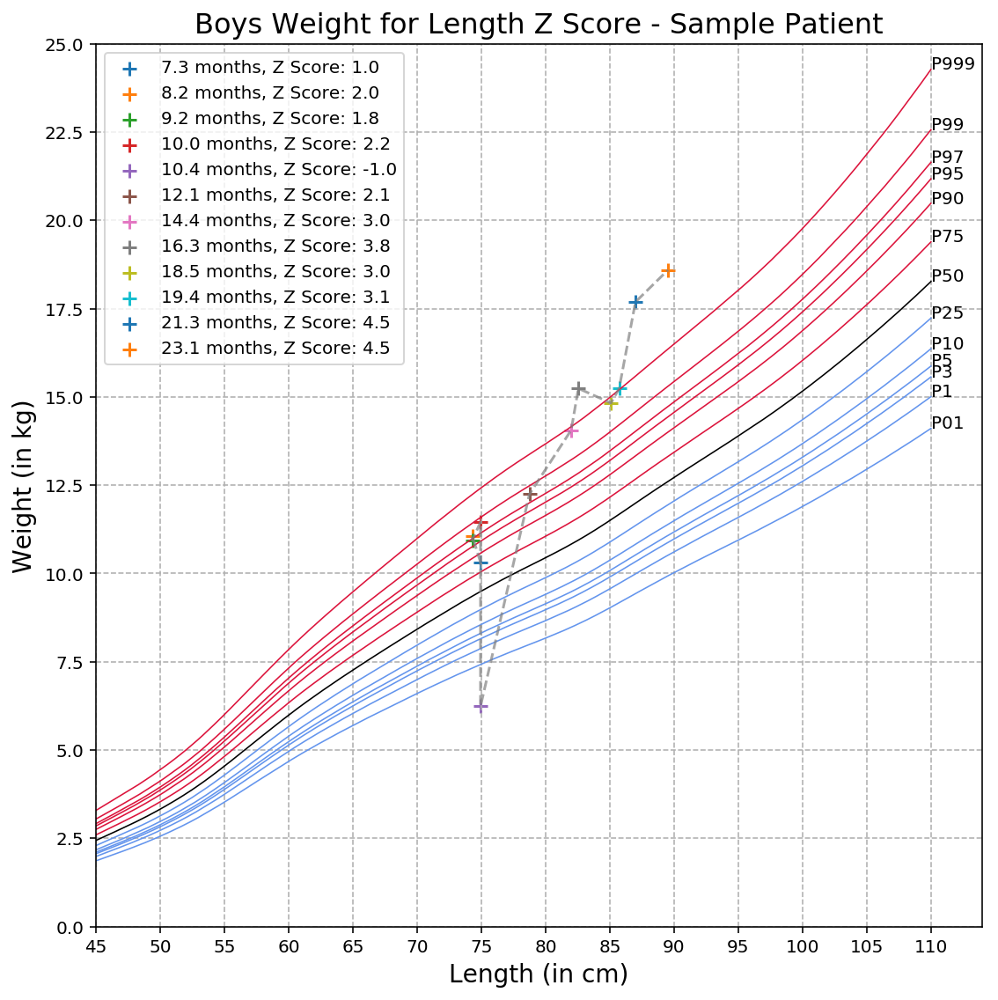

In [15]:
train.plot_growth_curve(d1,None,keys[6], hide_mrn=True)

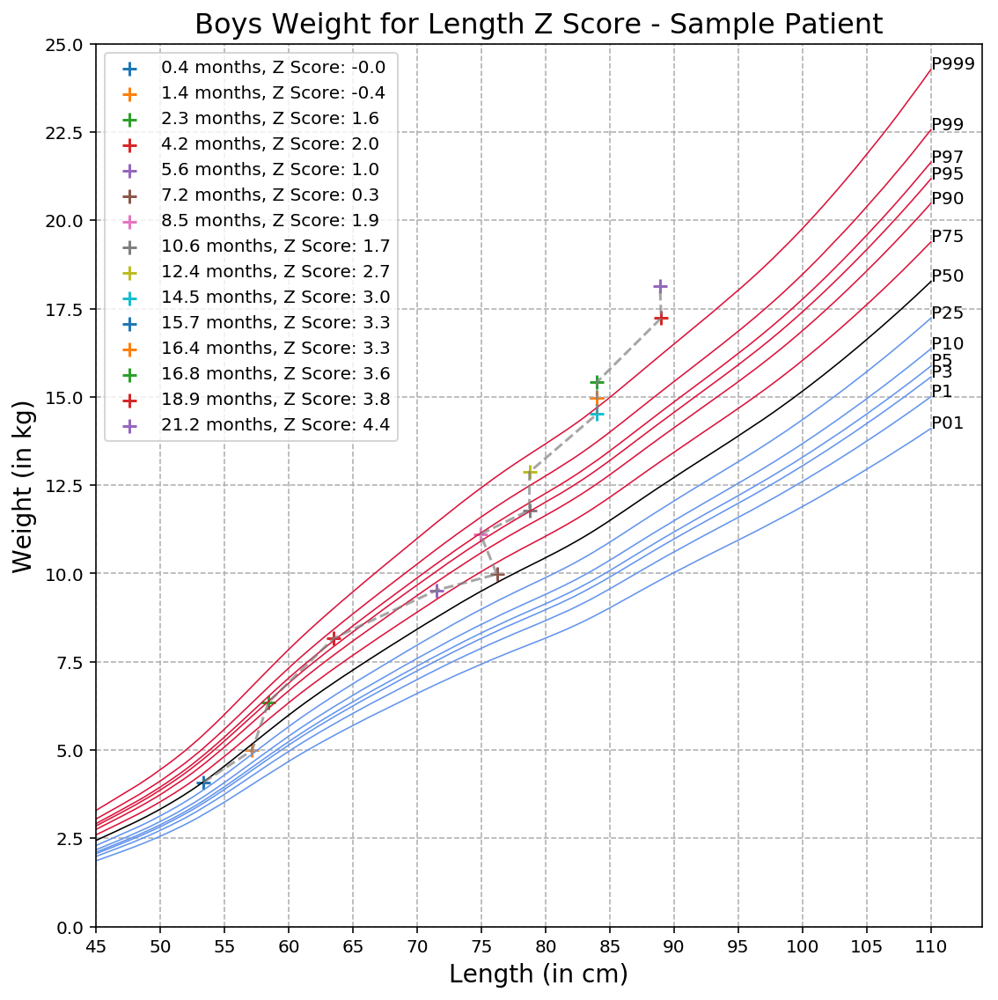

In [16]:
train.plot_growth_curve(d1,None,keys[7], hide_mrn=True)

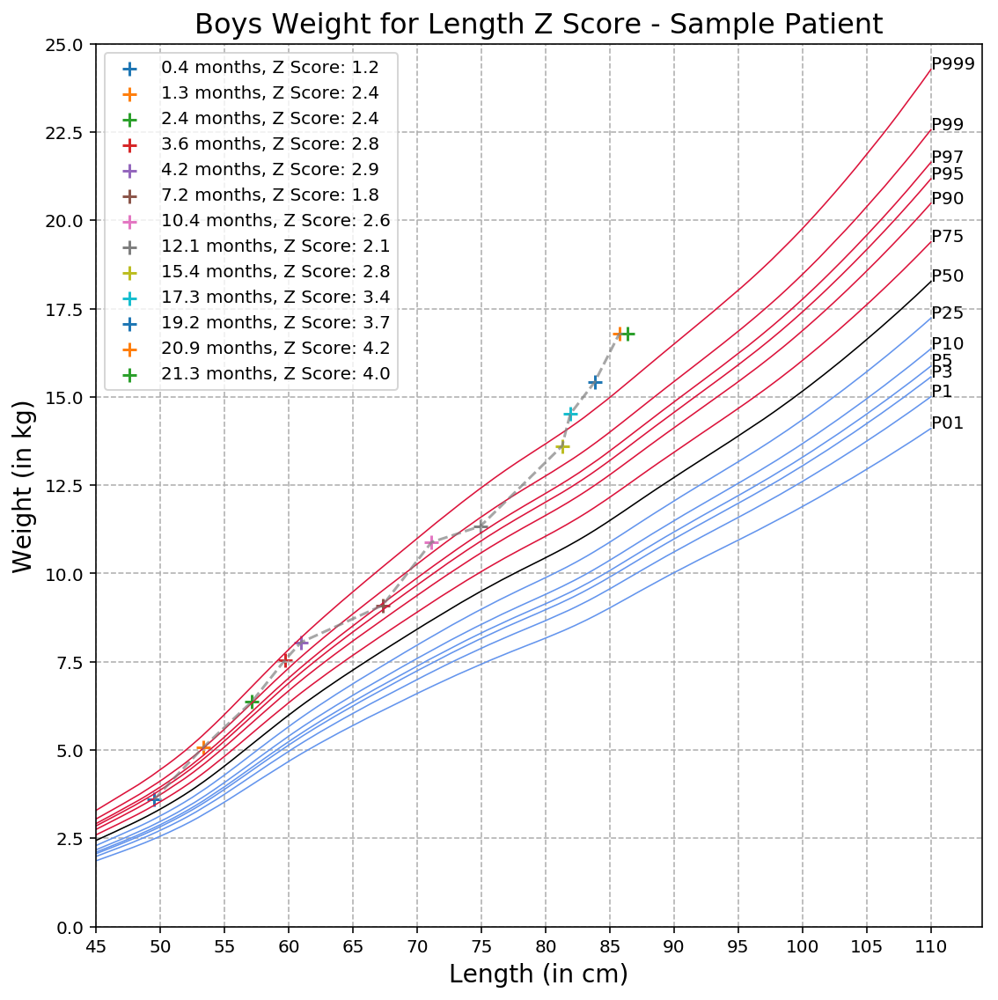

In [17]:
train.plot_growth_curve(d1,None,keys[8], hide_mrn=True)

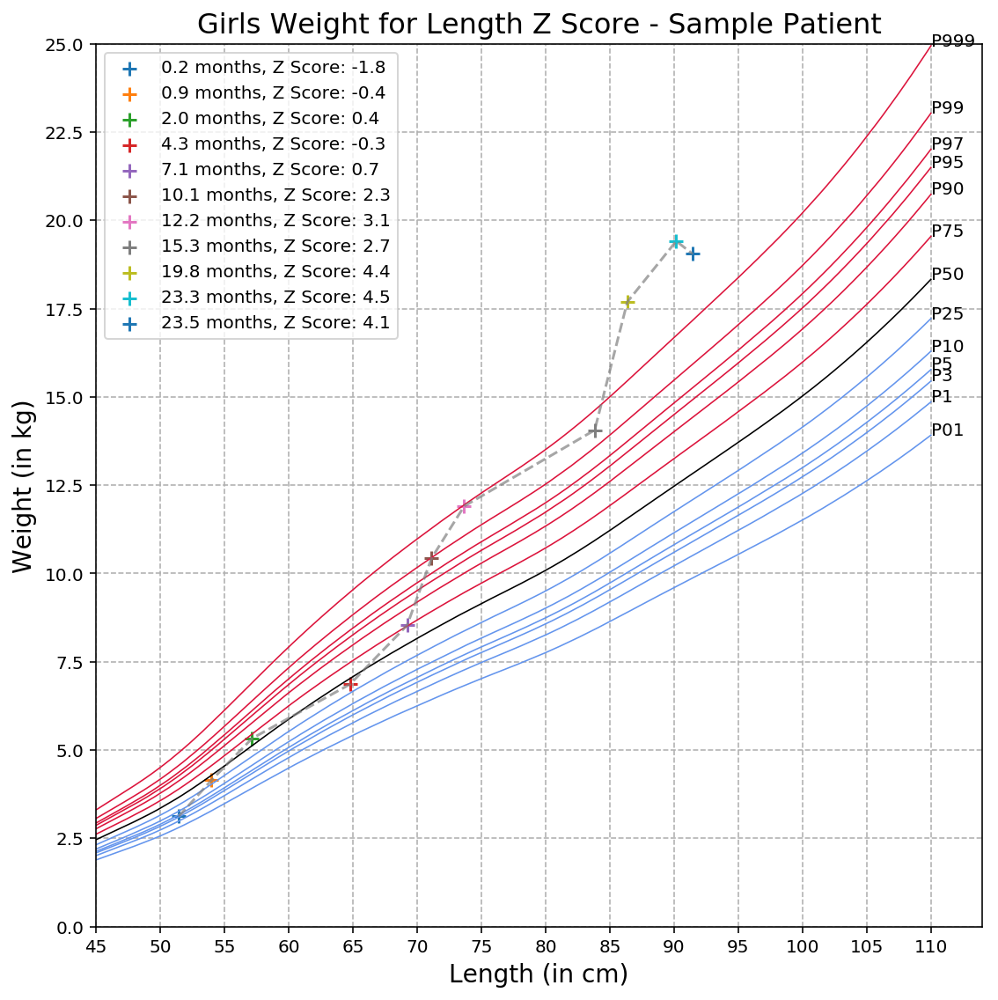

In [18]:
train.plot_growth_curve(d1,None,keys[9], hide_mrn=True)

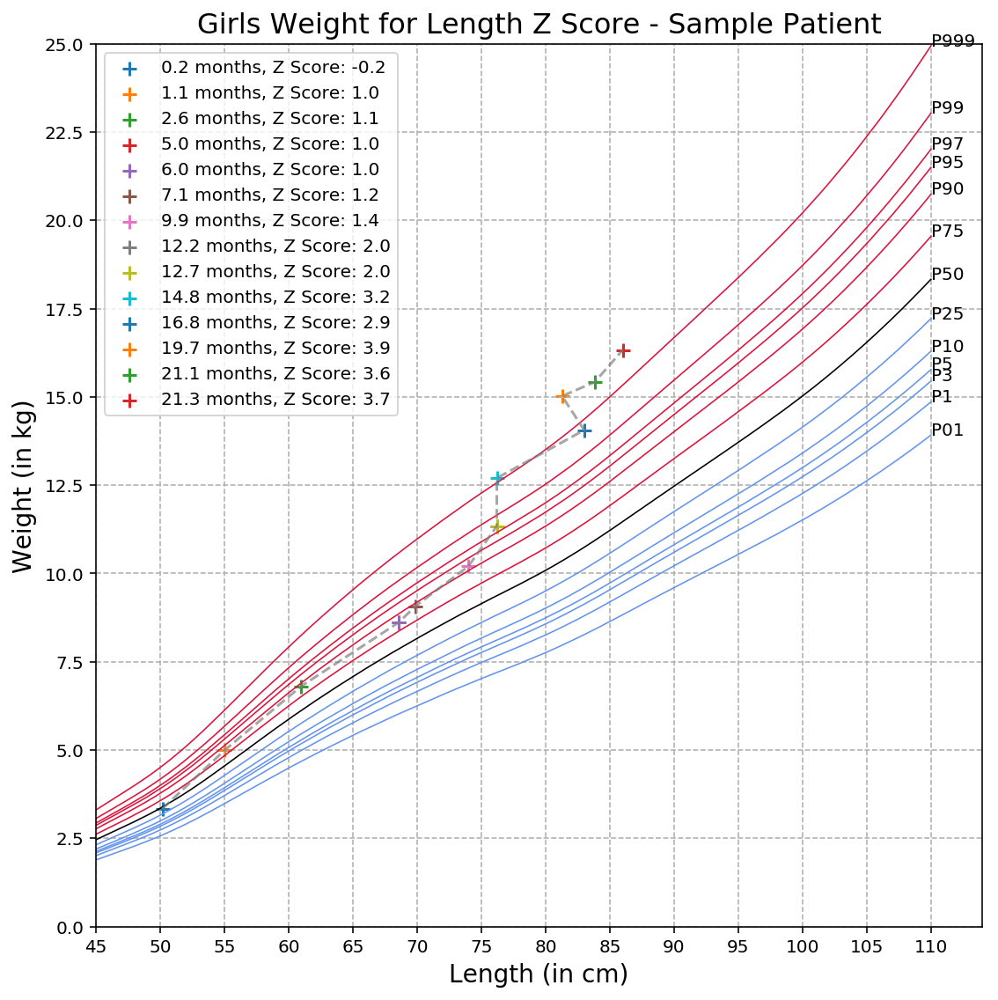

In [19]:
train.plot_growth_curve(d1,None,keys[10], hide_mrn=True)

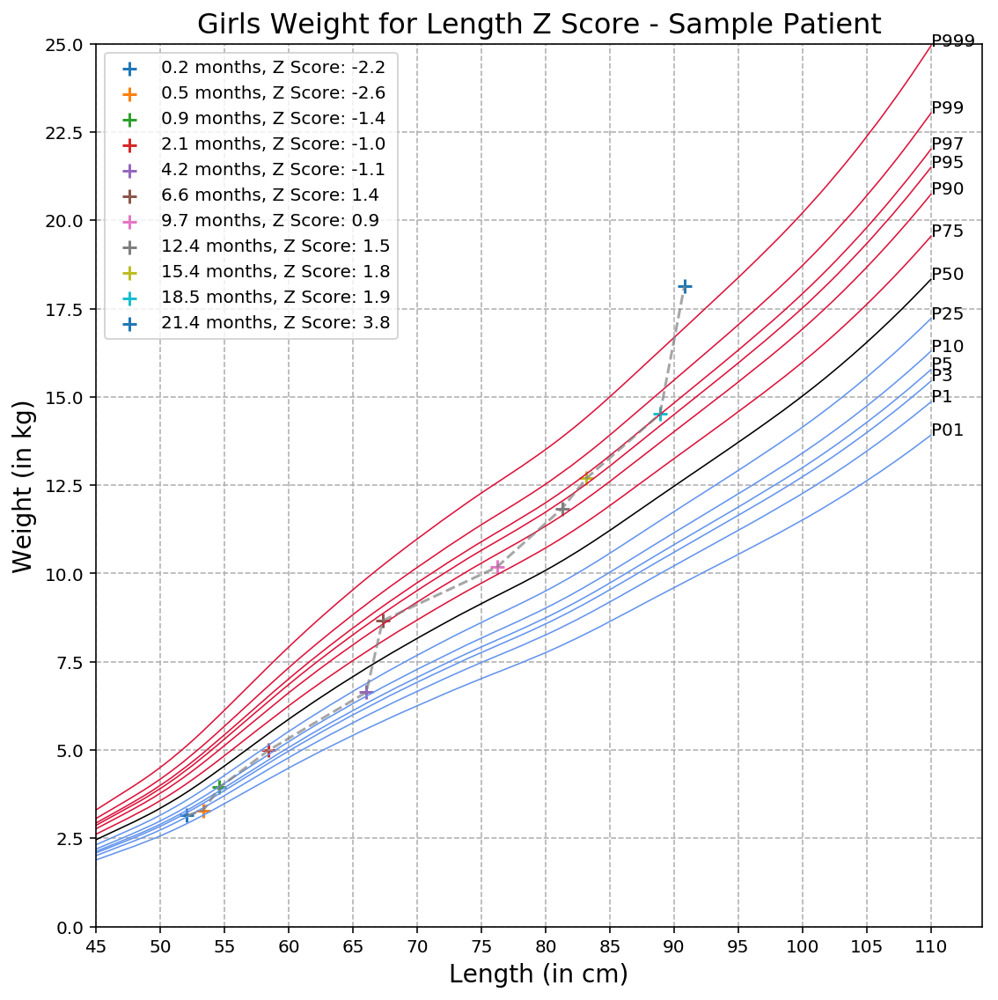

In [20]:
train.plot_growth_curve(d1,None,keys[11], hide_mrn=True)

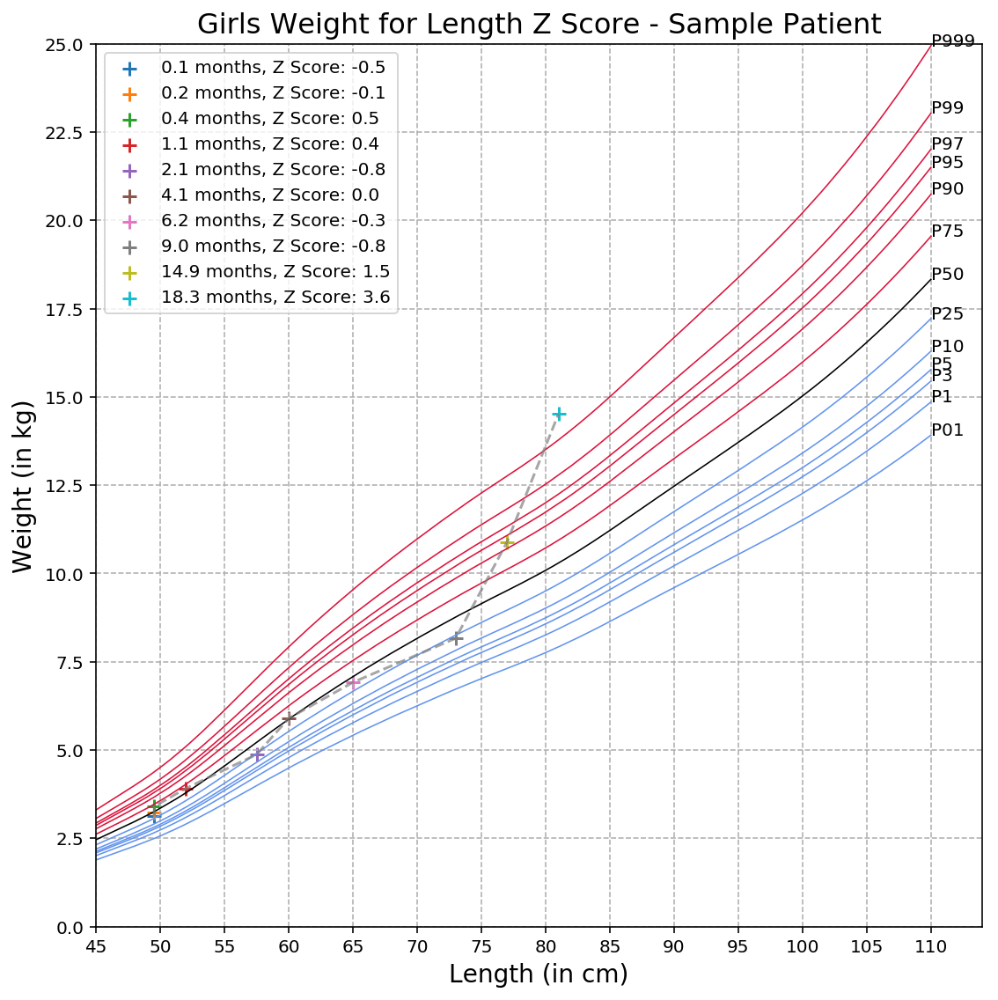

In [21]:
train.plot_growth_curve(d1,None,keys[12], hide_mrn=True)

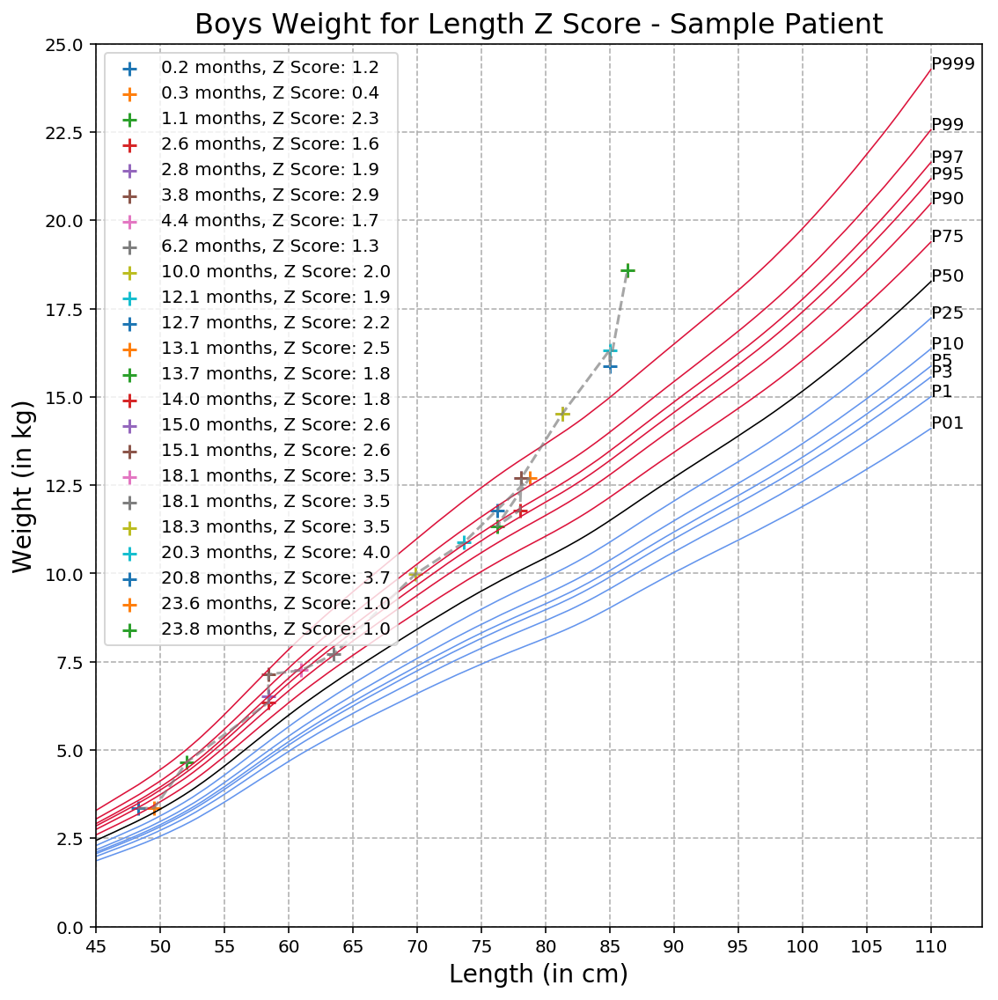

In [22]:
train.plot_growth_curve(d1,None,keys[13], hide_mrn=True)

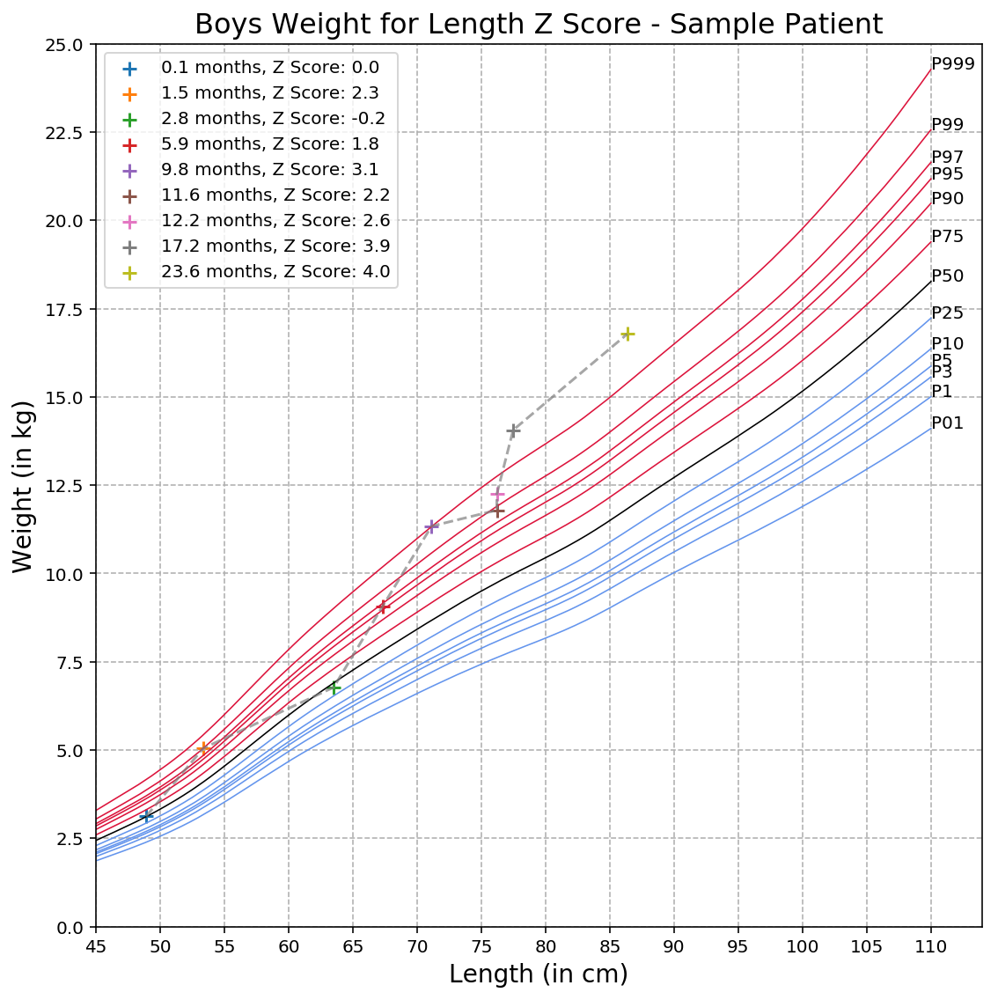

In [23]:
train.plot_growth_curve(d1,None,keys[14], hide_mrn=True)

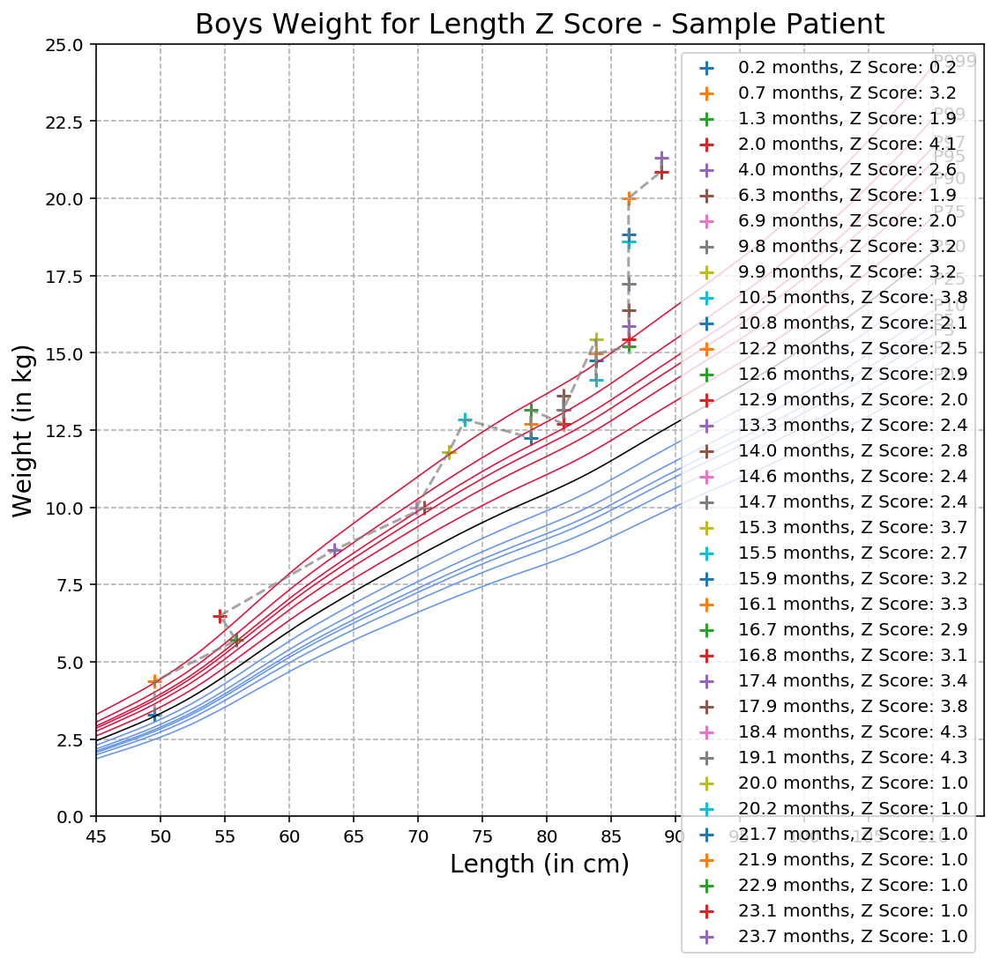

In [24]:
train.plot_growth_curve(d1,None,keys[15], hide_mrn=True)

# Load the results from the age varied predictions

In [25]:
auc_list_6 = pickle.load(open('../../out6/auc_list.pkl', 'rb'))
auc_list_12 = pickle.load(open('../../out12/auc_list.pkl', 'rb'))
auc_list_18 = pickle.load(open('../../out18/auc_list.pkl', 'rb'))
auc_list_24 = pickle.load(open('../../out24/auc_list.pkl', 'rb'))
auc_list_36 = pickle.load(open('../../out36/auc_list.pkl', 'rb'))
auc_list_48 = pickle.load(open('../../out48/auc_list.pkl', 'rb'))
auc_list = auc_list_6 + auc_list_12 + auc_list_18 + auc_list_24 + auc_list_36 + auc_list_48

titles_total_6 = pickle.load(open('../../out6/titles_total.pkl', 'rb'))
titles_total_12 = pickle.load(open('../../out12/titles_total.pkl', 'rb'),)
titles_total_18 = pickle.load(open('../../out18/titles_total.pkl', 'rb'))
titles_total_24 = pickle.load(open('../../out24/titles_total.pkl', 'rb'))
titles_total_36 = pickle.load(open('../../out36/titles_total.pkl', 'rb'))
titles_total_48 = pickle.load(open('../../out48/titles_total.pkl', 'rb'))
titles_total = titles_total_6 + titles_total_12 + titles_total_18 + titles_total_24 + titles_total_36 + titles_total_48

prec_total_6 = pickle.load(open('../../out6/prec_total.pkl', 'rb'))
prec_total_12 = pickle.load(open('../../out12/prec_total.pkl', 'rb'))
prec_total_18 = pickle.load(open('../../out18/prec_total.pkl', 'rb'))
prec_total_24 = pickle.load(open('../../out24/prec_total.pkl', 'rb'))
prec_total_36 = pickle.load(open('../../out36/prec_total.pkl', 'rb'),)
prec_total_48 = pickle.load(open('../../out48/prec_total.pkl', 'rb'))
prec_total = prec_total_6 + prec_total_12 + prec_total_18 + prec_total_24 + prec_total_36 + prec_total_48

recall_total_6 = pickle.load(open('../../out6/recall_total.pkl', 'rb'))
recall_total_18 = pickle.load(open('../../out18/recall_total.pkl', 'rb'))
recall_total_12 = pickle.load(open('../../out12/recall_total.pkl', 'rb'))
recall_total_24 = pickle.load(open('../../out24/recall_total.pkl', 'rb'))
recall_total_36 = pickle.load(open('../../out36/recall_total.pkl', 'rb'))
recall_total_48 = pickle.load(open('../../out48/recall_total.pkl', 'rb'))
recall_total = recall_total_6 + recall_total_12 + recall_total_18 + recall_total_24 + recall_total_36 + recall_total_48

spec_total_6 = pickle.load(open('../../out6/spec_total.pkl', 'rb'))
spec_total_18 = pickle.load(open('../../out18/spec_total.pkl', 'rb'))
spec_total_12 = pickle.load(open('../../out12/spec_total.pkl', 'rb'))
spec_total_24 = pickle.load(open('../../out24/spec_total.pkl', 'rb'))
spec_total_36 = pickle.load(open('../../out36/spec_total.pkl', 'rb'))
spec_total_48 = pickle.load(open('../../out48/spec_total.pkl', 'rb'))
spec_total = spec_total_6 + spec_total_12 + spec_total_18 + spec_total_24 + spec_total_36 + spec_total_48

# Results for the most predictive feature: 'Vital: BMI-latest'

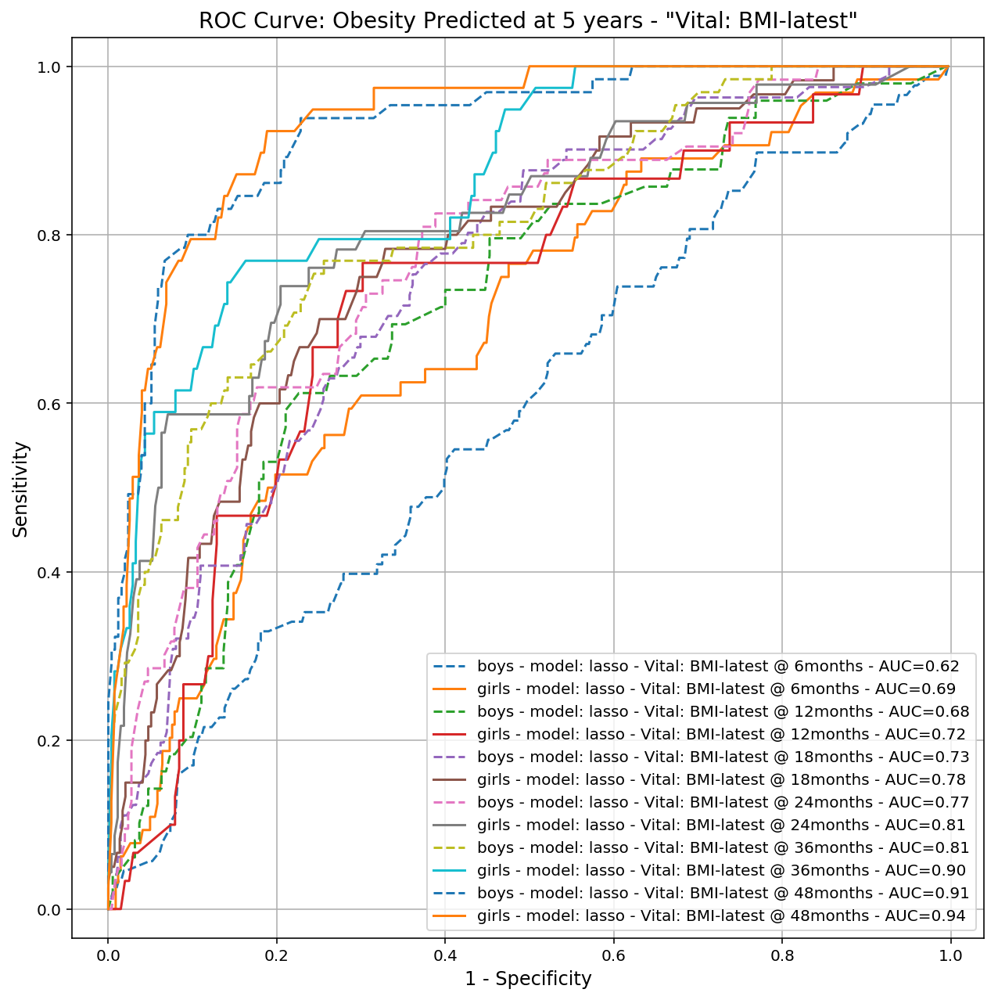

In [26]:
modelix = 'BMI'
plt.figure(figsize=(9,9))
for ix in range(len(prec_total)):
    if modelix not in titles_total[ix] or 'randomforest' in titles_total[ix] or 'gradientboost' in titles_total[ix]:
        continue
    if 'girls' in titles_total[ix]:
        plt.plot(1- np.array(spec_total[ix]), np.array(recall_total[ix]), linestyle='-', label=titles_total[ix]+' - AUC={:0.2f}'.format(auc_list[ix][0]))
    else:
        plt.plot(1- np.array(spec_total[ix]), np.array(recall_total[ix]), linestyle='--', label=titles_total[ix]+' - AUC={:0.2f}'.format(auc_list[ix][0]))

plt.legend(fontsize = 10)
plt.xlabel('1 - Specificity', fontsize=12)
plt.ylabel('Sensitivity', fontsize=12)
plt.axis('equal')
plt.title('ROC Curve: Obesity Predicted at 5 years - "Vital: BMI-latest"', fontsize=14)
plt.grid(True)
plt.tight_layout()
# plt.savefig(newdir+'/Pediatric_Girls_ROC.png', dpi=300)
plt.show()

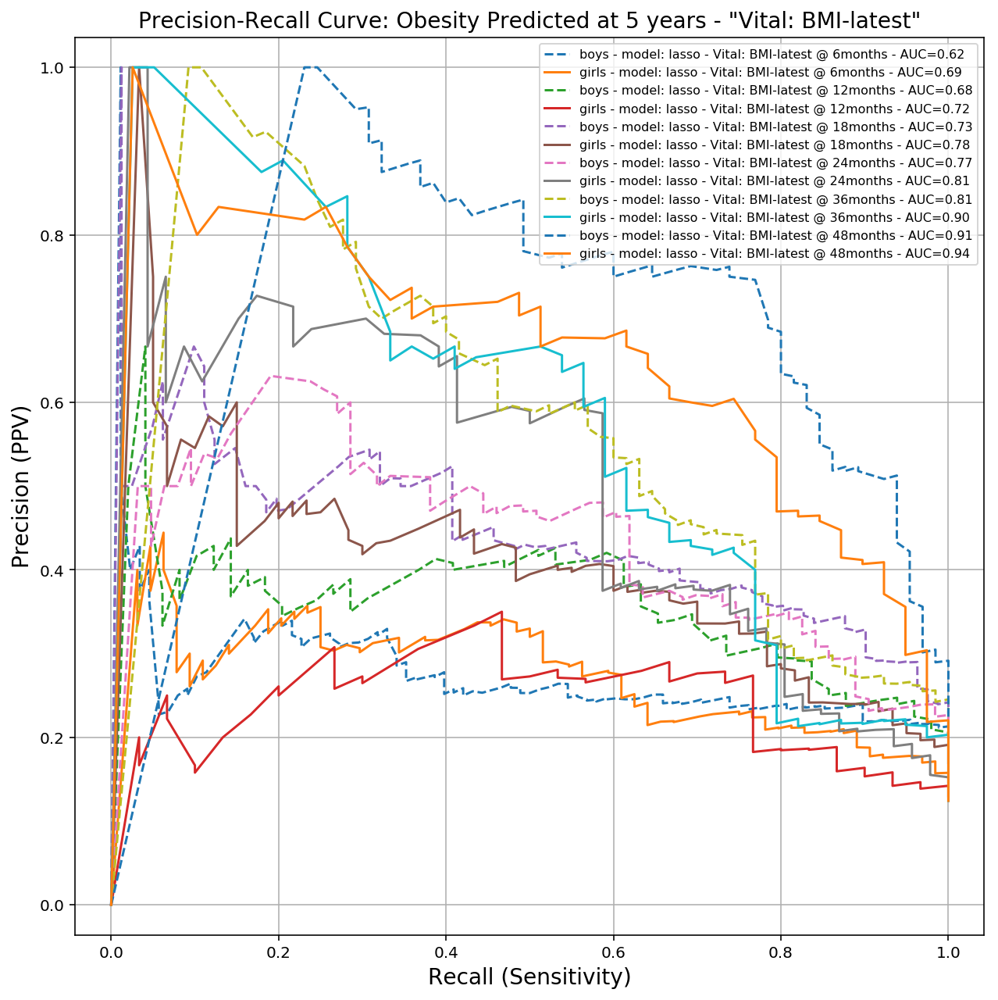

In [27]:
plt.figure(figsize=(9,9))
for ix in range(len(prec_total)):
    if modelix not in titles_total[ix] or 'randomforest' in titles_total[ix] or 'gradientboost' in titles_total[ix]:
        continue
    if 'girls' in titles_total[ix]:
        plt.plot(recall_total[ix], prec_total[ix], linestyle='-', label=titles_total[ix]+' - AUC={:0.2f}'.format(auc_list[ix][0]))
    else:
        plt.plot(recall_total[ix], prec_total[ix], linestyle='--', label=titles_total[ix]+' - AUC={:0.2f}'.format(auc_list[ix][0]))
plt.xlabel('Recall (Sensitivity)', fontsize=14)
plt.ylabel('Precision (PPV)', fontsize=14)
plt.legend(fontsize = 8)
plt.axis('equal')
plt.title('Precision-Recall Curve: Obesity Predicted at 5 years - "Vital: BMI-latest"', fontsize=14)
plt.grid()
plt.tight_layout()
# plt.savefig(newdir+'/Pediatric_Girls_PR.png', dpi=300)
plt.show()

# LASSO and Random Forest Comparison for Boys and Girls

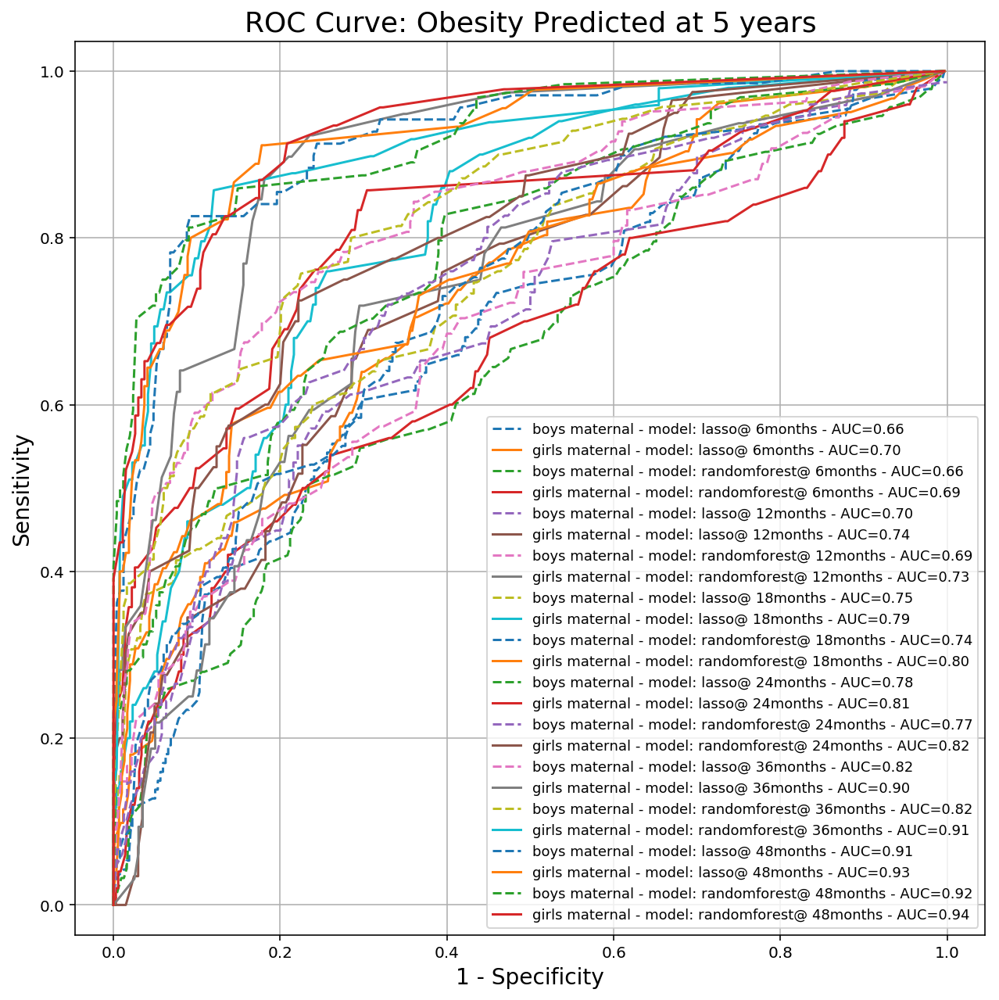

In [28]:
plt.figure(figsize=(9,9))
for ix in range(len(prec_total)):
    if any(x in titles_total[ix] for x in ('w/o vitals','Wt','no_maternal','w/o exclusions', 'BMI','gradientboost')):
        continue
    if 'girls' in titles_total[ix]:
        plt.plot(1- np.array(spec_total[ix]), np.array(recall_total[ix]), linestyle='-', label=titles_total[ix]+' - AUC={:0.2f}'.format(auc_list[ix][0]))
    else:
        plt.plot(1- np.array(spec_total[ix]), np.array(recall_total[ix]), linestyle='--', label=titles_total[ix]+' - AUC={:0.2f}'.format(auc_list[ix][0]))

plt.legend(fontsize = 9)
plt.xlabel('1 - Specificity', fontsize = 14)
plt.ylabel('Sensitivity', fontsize = 14)
plt.axis('equal')
plt.title('ROC Curve: Obesity Predicted at 5 years', fontsize = 18)
plt.grid(True)
plt.tight_layout()
# plt.savefig(newdir+'/Pediatric_Girls_ROC.png', dpi=300)
plt.show()

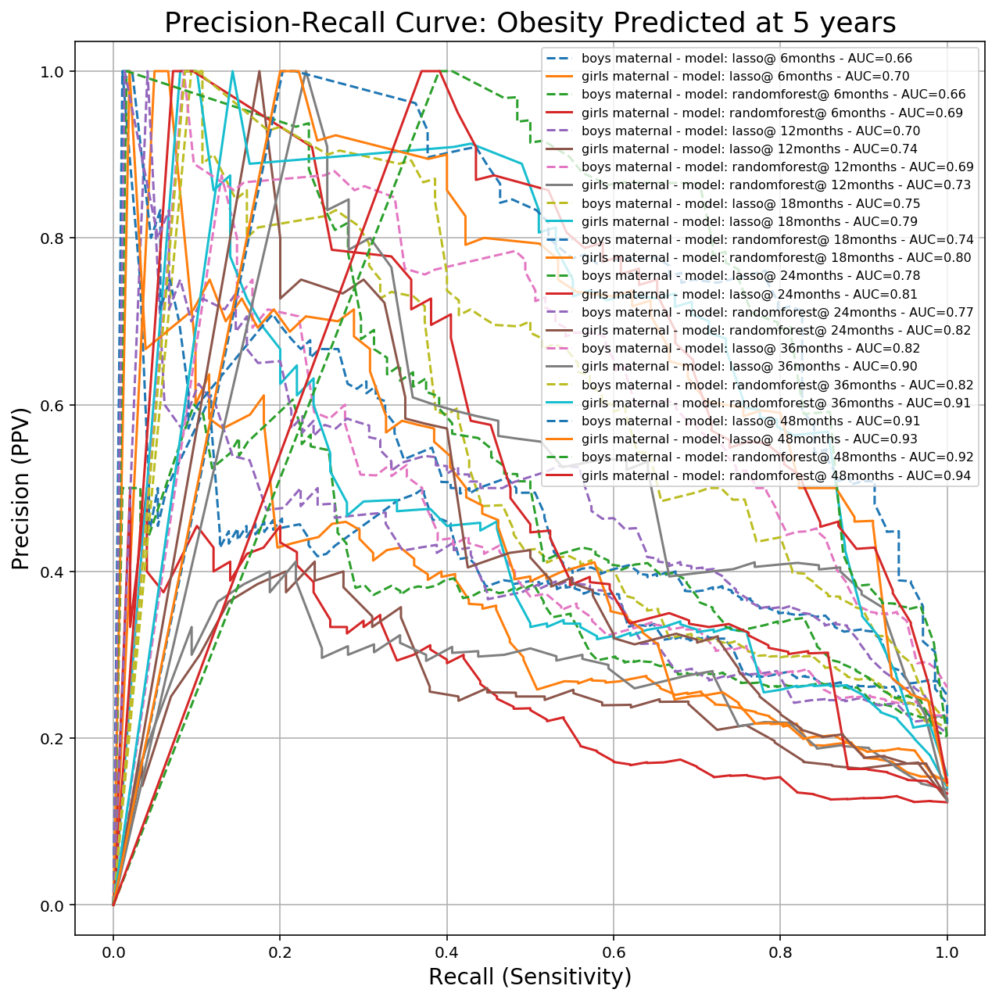

In [29]:
plt.figure(figsize=(9,9))
for ix in range(len(prec_total)):
    if any(x in titles_total[ix] for x in ('w/o vitals','Wt','no_maternal','w/o exclusions', 'BMI','gradientboost')):
        continue
    if 'girls' in titles_total[ix]:
        plt.plot(recall_total[ix], prec_total[ix], linestyle='-', label=titles_total[ix]+' - AUC={:0.2f}'.format(auc_list[ix][0]))
    else:
        plt.plot(recall_total[ix], prec_total[ix], linestyle='--', label=titles_total[ix]+' - AUC={:0.2f}'.format(auc_list[ix][0]))
plt.xlabel('Recall (Sensitivity)', fontsize = 14)
plt.ylabel('Precision (PPV)', fontsize = 14)
plt.legend(fontsize = 8)
plt.axis('equal')
plt.title('Precision-Recall Curve: Obesity Predicted at 5 years', fontsize = 18)
plt.grid()
plt.tight_layout()
# plt.savefig(newdir+'/Pediatric_Girls_PR.png', dpi=300)
plt.show()

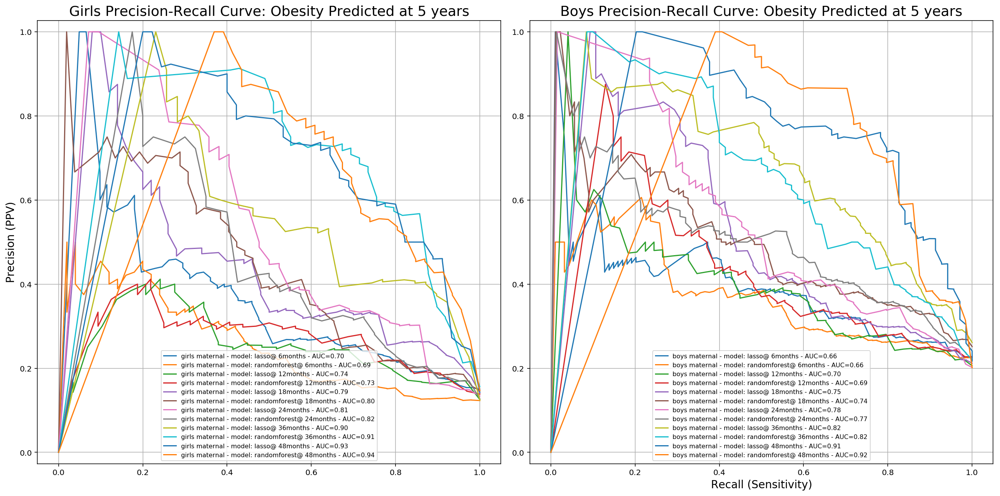

In [30]:
plt.figure(figsize=(18,9))
plt.subplot(1, 2, 1)
for ix in range(len(prec_total)):
    if any(x in titles_total[ix] for x in ('w/o vitals','Wt','no_maternal','w/o exclusions', 'BMI','gradientboost')):
        continue
    if 'girls' in titles_total[ix]:
        plt.plot(recall_total[ix], prec_total[ix], linestyle='-', label=titles_total[ix]+' - AUC={:0.2f}'.format(auc_list[ix][0]))
    else:
        continue
plt.ylabel('Precision (PPV)', fontsize = 14)
plt.legend(fontsize = 8, loc=8)
plt.axis('equal')
plt.title('Girls Precision-Recall Curve: Obesity Predicted at 5 years', fontsize = 18)
plt.grid()
plt.tight_layout()

plt.subplot(1, 2, 2)
for ix in range(len(prec_total)):
    if any(x in titles_total[ix] for x in ('w/o vitals','Wt','no_maternal','w/o exclusions', 'BMI','gradientboost')):
        continue
    if 'boys' in titles_total[ix]:
        plt.plot(recall_total[ix], prec_total[ix], linestyle='-', label=titles_total[ix]+' - AUC={:0.2f}'.format(auc_list[ix][0]))
    else:
        continue
plt.legend(fontsize = 8, loc=8)
plt.axis('equal')
plt.xlabel('Recall (Sensitivity)', fontsize = 14)
plt.title('Boys Precision-Recall Curve: Obesity Predicted at 5 years', fontsize = 18)
plt.grid()
plt.tight_layout()
# plt.savefig(newdir+'/Pediatric_Girls_PR.png', dpi=300)
plt.show()

# Results for the best model each prediction age

In [31]:
df_list = []
headers=['ix','title','auc','auc ste']
for ix,(auc,title) in enumerate(zip(auc_list,titles_total)):
    df_list.append([ix,title,auc[0],auc[1]])

df = pd.DataFrame(df_list, columns=headers)
top_ix = []
for m in ['@ 6months','@ 12months','@ 18months','@ 24months','@ 36months','@ 48months']:
    for g in ['boys','girls']:
        filtered = df[(df.title.str.contains(g)) & (df.title.str.contains(m)) & (~df.title.str.contains('no_maternal'))].sort_values(by='auc', axis=0, ascending=False)
        print(filtered.head(3))
        top_ix.append([g,m,filtered.iloc[0,0]])

    ix                                          title       auc   auc ste
19  19   boys maternal - model: randomforest@ 6months  0.661492  0.015467
3    3          boys maternal - model: lasso@ 6months  0.655511  0.015622
35  35  boys maternal - model: gradientboost@ 6months  0.645629  0.014772
    ix                                              title       auc   auc ste
11  11             girls maternal - model: lasso@ 6months  0.700119  0.022386
13  13  girls maternal w/o exclusions - model: lasso@ ...  0.692385  0.020549
14  14  girls - model: lasso - Vital: BMI-latest @ 6mo...  0.688237  0.021656
    ix                                              title       auc   auc ste
51  51             boys maternal - model: lasso@ 12months  0.698681  0.017191
83  83     boys maternal - model: gradientboost@ 12months  0.696231  0.018686
55  55  boys - model: lasso - Vital: Wt-latest @ 12months  0.691071  0.025317
    ix                                            title       auc   auc ste
59  

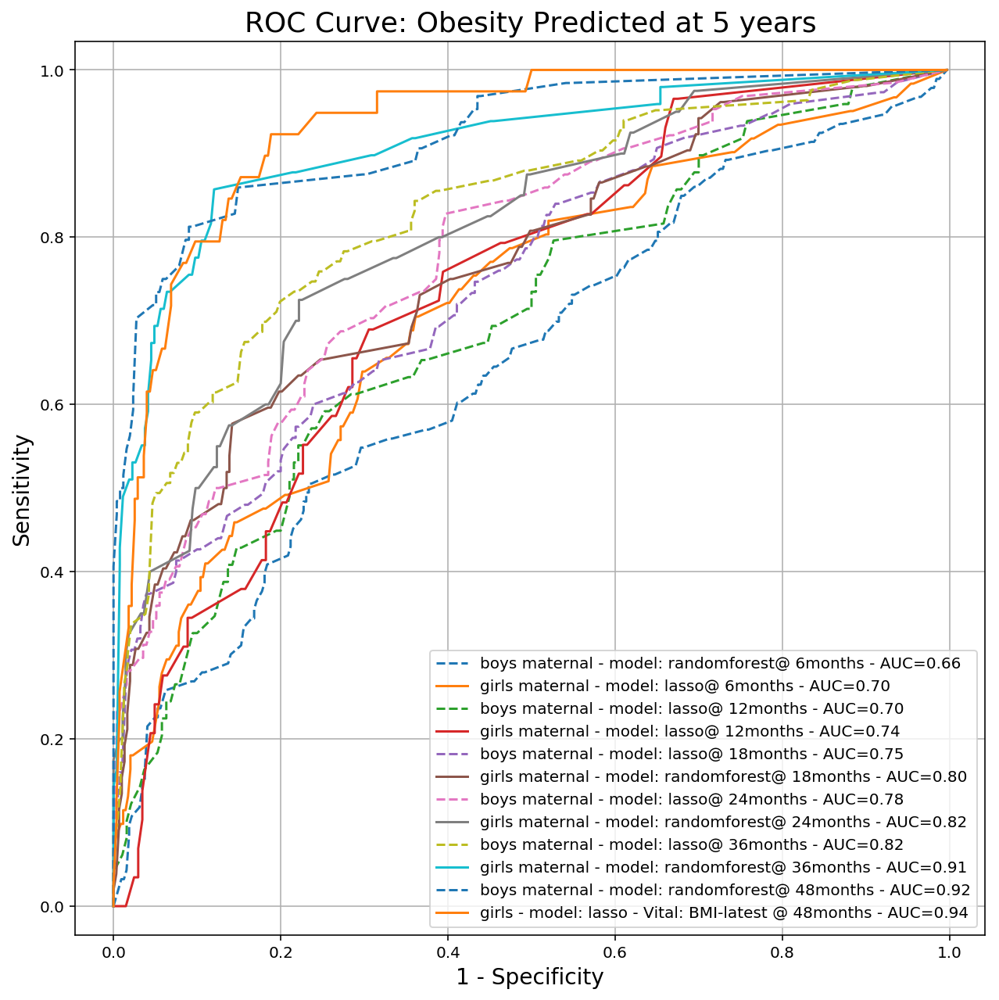

In [32]:
plt.figure(figsize=(9,9))
for l in top_ix:
    if 'girls' in titles_total[l[2]]:
        plt.plot(1- np.array(spec_total[l[2]]), np.array(recall_total[l[2]]), linestyle='-', label=titles_total[l[2]]+' - AUC={:0.2f}'.format(auc_list[l[2]][0]))
    else:
        plt.plot(1- np.array(spec_total[l[2]]), np.array(recall_total[l[2]]), linestyle='--', label=titles_total[l[2]]+' - AUC={:0.2f}'.format(auc_list[l[2]][0]))

plt.legend(fontsize = 10)
plt.xlabel('1 - Specificity', fontsize=14)
plt.ylabel('Sensitivity', fontsize=14)
plt.axis('equal')
plt.title('ROC Curve: Obesity Predicted at 5 years', fontsize=18)
plt.grid(True)
plt.tight_layout()
# plt.savefig(newdir+'/Pediatric_Girls_ROC.png', dpi=300)
plt.show()

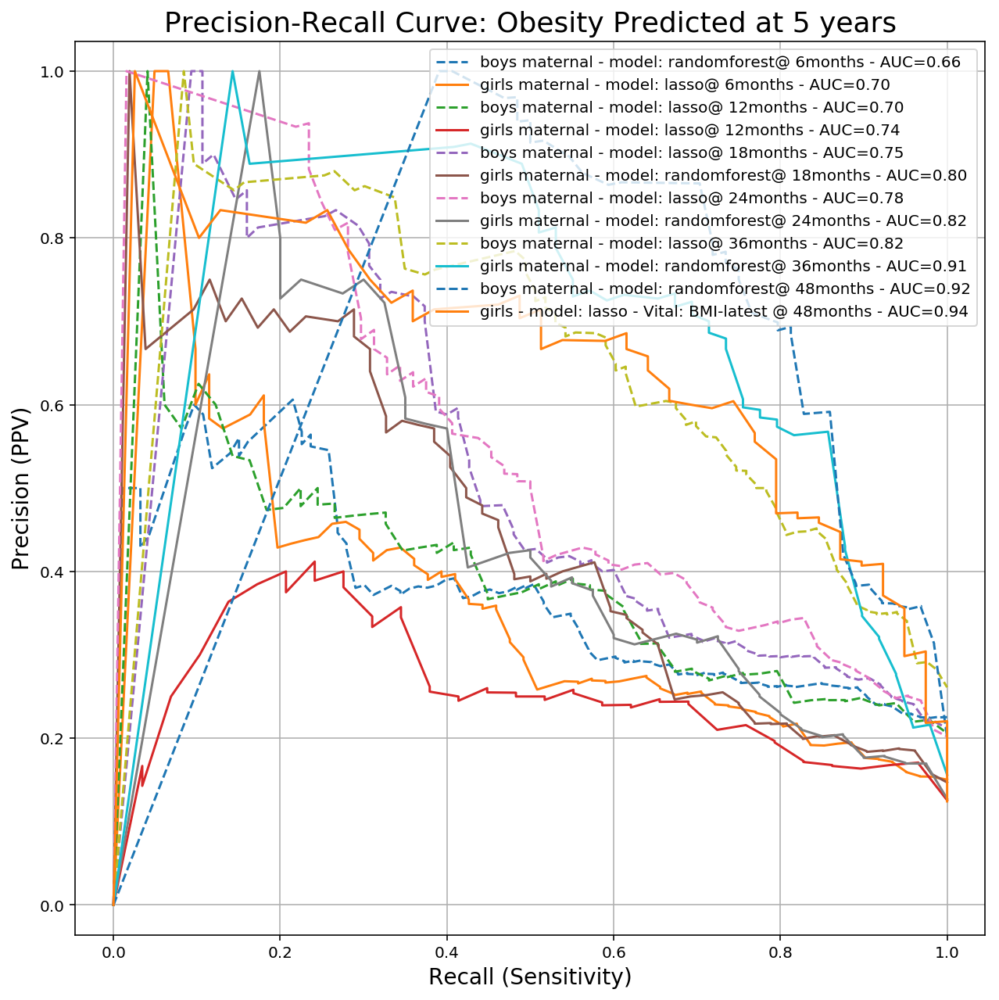

In [33]:
plt.figure(figsize=(9,9))
for l in top_ix:
    if 'girls' in titles_total[l[2]]:
        plt.plot(recall_total[l[2]], prec_total[l[2]], linestyle='-', label=titles_total[l[2]]+' - AUC={:0.2f}'.format(auc_list[l[2]][0]))
    else:
        plt.plot(recall_total[l[2]], prec_total[l[2]], linestyle='--', label=titles_total[l[2]]+' - AUC={:0.2f}'.format(auc_list[l[2]][0]))
plt.xlabel('Recall (Sensitivity)', fontsize=14)
plt.ylabel('Precision (PPV)', fontsize=14)
plt.legend(fontsize = 10)
plt.axis('equal')
plt.title('Precision-Recall Curve: Obesity Predicted at 5 years', fontsize=18)
plt.grid()
plt.tight_layout()
# plt.savefig(newdir+'/Pediatric_Girls_PR.png', dpi=300)
plt.show()

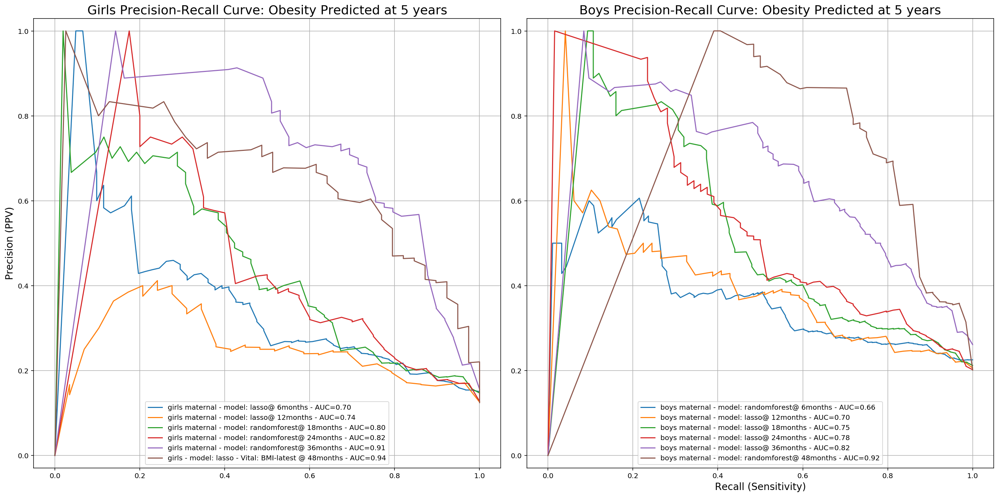

In [34]:
plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
for l in top_ix:
    if 'girls' in titles_total[l[2]]:
        plt.plot(recall_total[l[2]], prec_total[l[2]], linestyle='-', label=titles_total[l[2]]+' - AUC={:0.2f}'.format(auc_list[l[2]][0]))
    else:
        continue
plt.ylabel('Precision (PPV)', fontsize = 14)
plt.legend(fontsize=10, loc=8)
plt.axis('equal')
plt.title('Girls Precision-Recall Curve: Obesity Predicted at 5 years', fontsize = 18)
plt.grid()
plt.tight_layout()

plt.subplot(1, 2, 2)
for l in top_ix:
    if 'boys' in titles_total[l[2]]:
        plt.plot(recall_total[l[2]], prec_total[l[2]], linestyle='-', label=titles_total[l[2]]+' - AUC={:0.2f}'.format(auc_list[l[2]][0]))
    else:
        continue
plt.legend(fontsize=10, loc=8)
plt.axis('equal')
plt.xlabel('Recall (Sensitivity)', fontsize = 14)
plt.title('Boys Precision-Recall Curve: Obesity Predicted at 5 years', fontsize = 18)
plt.grid()
plt.tight_layout()
# plt.savefig(newdir+'/Pediatric_Girls_PR.png', dpi=300)
plt.show()

# Load the best models

In [35]:
# model_list_6 = pickle.load(open('../../out6/model_list.pkl', 'rb'))
# model_list_12 = pickle.load(open('../../out12/model_list.pkl', 'rb'))
# model_list_18 = pickle.load(open('../../out18/model_list.pkl', 'rb'))
model_list_24 = pickle.load(open('../../out24/model_list.pkl', 'rb'))
# model_list_36 = pickle.load(open('../../out36/model_list.pkl', 'rb'))
# model_list_48 = pickle.load(open('../../out48/model_list.pkl', 'rb'))
# model_list = model_list_6 + model_list_12 + model_list_18 + model_list_24 + model_list_36 + model_list_48

# boys6 = np.load('../../out6/data_transformed_randomforest_boys_maternal_6_months.npz')
# girls6 = np.load('../../out6/data_transformed_lasso_girls_maternal_6_months.npz')
# boys12 = np.load('../../out12/data_transformed_lasso_boys_maternal_12_months.npz')
# girls12 = np.load('../../out12/data_transformed_lasso_girls_maternal_12_months.npz')
# boys18 = np.load('../../out18/data_transformed_lasso_boys_maternal_18_months.npz')
# girls18 = np.load('../../out18/data_transformed_randomforest_girls_maternal_18_months.npz')
boys24 = np.load('../../out24/data_transformed_lasso_boys_maternal_24_months.npz')
girls24 = np.load('../../out24/data_transformed_randomforest_girls_maternal_24_months.npz')
# boys36 = np.load('../../out36/data_transformed_lasso_boys_maternal_36_months.npz')
# girls36 = np.load('../../out36/data_transformed_randomforest_girls_maternal_36_months.npz')
# boys48 = np.load('../../out48/data_transformed_randomforest_boys_maternal_48_months.npz')
# girls48 = np.load('../../out48/data_transformed_lasso_girls_maternal_Vital: Wt-latest_48_months.npz')

# test_sets_best = [boys6,girls6,boys12,girls12,boys18,girls18,boys24,girls24,boys36,girls36,boys48,girls48]
test_sets_best = {
#     'boys6': [boys6['x'][boys6['modeling_ix']][boys6['test_ix']],
#              boys6['y'][boys6['modeling_ix']][boys6['test_ix']],
#              boys6['ylabel'][boys6['modeling_ix']][boys6['test_ix']],
#              boys6['mrns'][boys6['modeling_ix']][boys6['test_ix']],
#              111],
#     'girls6': [girls6['x'][girls6['modeling_ix']][girls6['test_ix']],
#              girls6['y'][girls6['modeling_ix']][girls6['test_ix']],
#              girls6['ylabel'][girls6['modeling_ix']][girls6['test_ix']],
#              girls6['mrns'][girls6['modeling_ix']][girls6['test_ix']],
#              111],
#     'boys12': [boys12['x'][boys12['modeling_ix']][boys12['test_ix']],
#              boys12['y'][boys12['modeling_ix']][boys12['test_ix']],
#              boys12['ylabel'][boys12['modeling_ix']][boys12['test_ix']],
#              boys12['mrns'][boys12['modeling_ix']][boys12['test_ix']],
#              111],
#     'girls12': [girls12['x'][girls12['modeling_ix']][girls12['test_ix']],
#              girls12['y'][girls12['modeling_ix']][girls12['test_ix']],
#              girls12['ylabel'][girls12['modeling_ix']][girls12['test_ix']],
#              girls12['mrns'][girls12['modeling_ix']][girls12['test_ix']],
#              111],
#     'boys18': [boys18['x'][boys18['modeling_ix']][boys18['test_ix']],
#              boys18['y'][boys18['modeling_ix']][boys18['test_ix']],
#              boys18['ylabel'][boys18['modeling_ix']][boys18['test_ix']],
#              boys18['mrns'][boys18['modeling_ix']][boys18['test_ix']],
#              111],
#     'girls18': [girls18['x'][girls18['modeling_ix']][girls18['test_ix']],
#              girls18['y'][girls18['modeling_ix']][girls18['test_ix']],
#              girls18['ylabel'][girls18['modeling_ix']][girls18['test_ix']],
#              girls18['mrns'][girls18['modeling_ix']][girls18['test_ix']],
#              111],
    'boys24': [boys24['x'][boys24['modeling_ix']][boys24['test_ix']],
             boys24['y'][boys24['modeling_ix']][boys24['test_ix']],
             boys24['ylabel'][boys24['modeling_ix']][boys24['test_ix']],
             boys24['mrns'][boys24['modeling_ix']][boys24['test_ix']],
             111],
    'girls24': [girls24['x'][girls24['modeling_ix']][girls24['test_ix']],
             girls24['y'][girls24['modeling_ix']][girls24['test_ix']],
             girls24['ylabel'][girls24['modeling_ix']][girls24['test_ix']],
             girls24['mrns'][girls24['modeling_ix']][girls24['test_ix']],
             111]
#     'boys36': [boys36['x'][boys36['modeling_ix']][boys36['test_ix']],
#              boys36['y'][boys36['modeling_ix']][boys36['test_ix']],
#              boys36['ylabel'][boys36['modeling_ix']][boys36['test_ix']],
#              boys36['mrns'][boys36['modeling_ix']][boys36['test_ix']],
#              111],
#     'girls36': [girls36['x'][girls36['modeling_ix']][girls36['test_ix']],
#              girls36['y'][girls36['modeling_ix']][girls36['test_ix']],
#              girls36['ylabel'][girls36['modeling_ix']][girls36['test_ix']],
#              girls36['mrns'][girls36['modeling_ix']][boys6['test_ix']],
#              111],
#     'boys48': [boys48['x'][boys48['modeling_ix']][boys48['test_ix']],
#              boys48['y'][boys48['modeling_ix']][boys48['test_ix']],
#              boys48['ylabel'][boys48['modeling_ix']][boys48['test_ix']],
#              boys48['mrns'][boys48['modeling_ix']][boys48['test_ix']],
#              111],
#     'girls48': [girls48['x'][boys6['modeling_ix']][girls48['test_ix']],
#              girls48['y'][boys6['modeling_ix']][girls48['test_ix']],
#              girls48['ylabel'][boys6['modeling_ix']][girls48['test_ix']],
#              girls48['mrns'][girls48['modeling_ix']][girls48['test_ix']],
#              111]
}

In [36]:
df_l = []
headers=['ix','title','auc','auc ste']
for ix,(auc,title) in enumerate(zip(auc_list_24,titles_total_24)):
    df_l.append([ix,title,auc[0],auc[1]])

df = pd.DataFrame(df_l, columns=headers)
top_ix = []
for g in ['boys','girls']:
    filtered = df[(df.title.str.contains(g)) & (~df.title.str.contains('no_maternal'))].sort_values(by='auc', axis=0, ascending=False)
    print(filtered.head(3))
    top_ix.append([g,filtered.iloc[0,0]])

    ix                                              title       auc   auc ste
3    3             boys maternal - model: lasso@ 24months  0.783122  0.018409
7    7  boys - model: lasso - Vital: Wt-latest @ 24months  0.781007  0.013705
19  19      boys maternal - model: randomforest@ 24months  0.772888  0.012462
    ix                                            title       auc   auc ste
27  27   girls maternal - model: randomforest@ 24months  0.823647  0.014116
43  43  girls maternal - model: gradientboost@ 24months  0.820250  0.016928
11  11          girls maternal - model: lasso@ 24months  0.811070  0.008250


In [37]:
prec_24 = []
recall_24 = []
spec_24 = []
auc_24 = []
titles = ['Boys LASSO - original','Boys LASSO - inclusion','Boys LASSO - inclusion mod','Girls LASSO - original','Girls LASSO - inclusion','Girls LASSO - inclusion mod']
variations = ['original', 'inclusion', 'mod. inclusion']
headers = feature_headers.tolist()

for test,top,model in zip(test_sets_best.keys(), top_ix, model_list_24):
    for var in variations:
        print(titles_total_24[top[1]], var)
        if test=='boys24':
            data = boys24 if test == 'boys24' else girls24
        
        x1_inclusion = x1[data['ix2']][data['modeling_ix']][data['test_ix']]
        if var == 'original':
            inc_ix = np.array([True]*x1_inclusion.shape[0])
        elif var == 'inclusion':
            inc_ix = (x1_inclusion[:,feature_headers.tolist().index('MatDeliveryAge')]>=18) & \
                (x1_inclusion[:,feature_headers.tolist().index('Maternal-ethnicity:HISPANIC/LATINO')]>0) & \
                (x1_inclusion[:,feature_headers.tolist().index('Maternal Diagnosis:9ccs195:Ot compl bir')]==0)
        elif var == 'mod. inclusion':
            inc_ix = (x1_inclusion[:,feature_headers.tolist().index('MatDeliveryAge')]>=18) & \
                (x1_inclusion[:,feature_headers.tolist().index('Maternal Diagnosis:9ccs195:Ot compl bir')]==0)
        if all(inc_ix == False):
            print('No valid patients')
            prec_list = [0,0,0,0,0]
            recall_list = [0,0,0,0,0]
            spec_list = [0,0,0,0,0]
            continue
            
        xtest = data['x'][data['modeling_ix']][data['test_ix']][inc_ix,:]
        ytest = data['y'][data['modeling_ix']][data['test_ix']][inc_ix]
        ytestlabel = data['ylabel'][data['modeling_ix']][data['test_ix']][inc_ix]
        mrns = data['mrns'][data['modeling_ix']][data['test_ix']][inc_ix]
        headers = data['features']
        model = model_list_24[top[1]]
        
        try:
            ytestpred = model.predict(xtest)
        except:
            continue

        fpr, tpr, thresholds = metrics.roc_curve(ytestlabel, ytestpred)
        auc_test = metrics.auc(fpr, tpr)
        auc_24.append(auc_test)
        
        operating_Thresholds = []
        operating_levels = [0, 0.0001, 0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
        ix_level = 0

        for ix, thr in enumerate(thresholds):
            if fpr[ix] >= operating_levels[ix_level]:
                operating_Thresholds.append(thr)
                ix_level += 1
                if ix_level == len(operating_levels):
                    break

        operating_Thresholds = thresholds
        report_metrics = 'Test set metrics:\n'
        prec_list = []
        recall_list = []
        spec_list = []
        for t in operating_Thresholds:
            tp = ((ytestlabel > 0) & (ytestpred.ravel() > t)).sum()*1.0
            tn = ((ytestlabel == 0) & (ytestpred.ravel() <= t)).sum()*1.0
            fn = ((ytestlabel > 0) & (ytestpred.ravel() <= t)).sum()*1.0
            fp = ((ytestlabel == 0) & (ytestpred.ravel() > t)).sum()*1.0

            sens = tp / (tp + fn) if (tp + fn) != 0 else 0.0
            spec = tn / (tn + fp) if (tn + fp) != 0 else 0.0
            ppv = tp / (tp + fp) if (tp + fp) != 0 else 0.0
            acc = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) != 0 else 0.0
            f1 = 2*tp / (2*tp + fp + fn) if (2*tp + fp + fn) != 0 else 0.0
            report_metrics += '@threshold:{0:4.3f}, sens:{1:4.3f}, spec:{2:4.3f}, ppv:{3:4.3f}, acc:{4:4.3f}, f1:{5:4.3f} total+:{6:4.3f}\n'.format(t, sens, spec, ppv, acc, f1, tp+fp)
            
            prec_list.append(ppv)
            recall_list.append(sens)
            spec_list.append(spec)
        prec_24.append(prec_list)
        recall_24.append(recall_list)
        spec_24.append(spec_list)
        
        print(report_metrics)

boys maternal - model: lasso@ 24months original
Test set metrics:
@threshold:1.502, sens:0.000, spec:1.000, ppv:0.000, acc:0.799, f1:0.000 total+:0.000
@threshold:1.350, sens:0.016, spec:1.000, ppv:1.000, acc:0.802, f1:0.031 total+:1.000
@threshold:0.713, sens:0.219, spec:0.996, ppv:0.933, acc:0.840, f1:0.354 total+:15.000
@threshold:0.703, sens:0.234, spec:0.996, ppv:0.938, acc:0.843, f1:0.375 total+:16.000
@threshold:0.696, sens:0.234, spec:0.992, ppv:0.882, acc:0.840, f1:0.370 total+:17.000
@threshold:0.673, sens:0.250, spec:0.988, ppv:0.842, acc:0.840, f1:0.386 total+:19.000
@threshold:0.663, sens:0.266, spec:0.984, ppv:0.810, acc:0.840, f1:0.400 total+:21.000
@threshold:0.663, sens:0.281, spec:0.984, ppv:0.818, acc:0.843, f1:0.419 total+:22.000
@threshold:0.655, sens:0.281, spec:0.980, ppv:0.783, acc:0.840, f1:0.414 total+:23.000
@threshold:0.639, sens:0.297, spec:0.969, ppv:0.704, acc:0.833, f1:0.418 total+:27.000
@threshold:0.624, sens:0.297, spec:0.965, ppv:0.679, acc:0.830, f1

Test set metrics:
@threshold:2.350, sens:0.000, spec:1.000, ppv:0.000, acc:0.849, f1:0.000 total+:0.000
@threshold:1.350, sens:0.000, spec:1.000, ppv:0.000, acc:0.849, f1:0.000 total+:0.000
@threshold:0.750, sens:0.154, spec:0.993, ppv:0.800, acc:0.866, f1:0.258 total+:5.000
@threshold:0.703, sens:0.192, spec:0.993, ppv:0.833, acc:0.872, f1:0.312 total+:6.000
@threshold:0.696, sens:0.192, spec:0.986, ppv:0.714, acc:0.866, f1:0.303 total+:7.000
@threshold:0.673, sens:0.231, spec:0.979, ppv:0.667, acc:0.866, f1:0.343 total+:9.000
@threshold:0.670, sens:0.231, spec:0.973, ppv:0.600, acc:0.860, f1:0.333 total+:10.000
@threshold:0.645, sens:0.269, spec:0.952, ppv:0.500, acc:0.849, f1:0.350 total+:14.000
@threshold:0.598, sens:0.308, spec:0.945, ppv:0.500, acc:0.849, f1:0.381 total+:16.000
@threshold:0.555, sens:0.346, spec:0.945, ppv:0.529, acc:0.855, f1:0.419 total+:17.000
@threshold:0.552, sens:0.346, spec:0.938, ppv:0.500, acc:0.849, f1:0.409 total+:18.000
@threshold:0.551, sens:0.385, s

Test set metrics:
@threshold:1.456, sens:0.000, spec:1.000, ppv:0.000, acc:0.838, f1:0.000 total+:0.000
@threshold:1.164, sens:0.043, spec:1.000, ppv:1.000, acc:0.845, f1:0.083 total+:1.000
@threshold:1.151, sens:0.087, spec:1.000, ppv:1.000, acc:0.852, f1:0.160 total+:2.000
@threshold:1.104, sens:0.087, spec:0.992, ppv:0.667, acc:0.845, f1:0.154 total+:3.000
@threshold:0.955, sens:0.130, spec:0.966, ppv:0.429, acc:0.831, f1:0.200 total+:7.000
@threshold:0.885, sens:0.174, spec:0.958, ppv:0.444, acc:0.831, f1:0.250 total+:9.000
@threshold:0.803, sens:0.217, spec:0.941, ppv:0.417, acc:0.824, f1:0.286 total+:12.000
@threshold:0.773, sens:0.217, spec:0.933, ppv:0.385, acc:0.817, f1:0.278 total+:13.000
@threshold:0.750, sens:0.261, spec:0.924, ppv:0.400, acc:0.817, f1:0.316 total+:15.000
@threshold:0.696, sens:0.348, spec:0.916, ppv:0.444, acc:0.824, f1:0.390 total+:18.000
@threshold:0.655, sens:0.391, spec:0.899, ppv:0.429, acc:0.817, f1:0.409 total+:21.000
@threshold:0.576, sens:0.478, s

# Comparison of Mary Jo's Inclusion Criteria to Pediatric Study

<ul>
    <li>Using the best model for boys and girsl where prediction is at 24 months</li>
    <li>Original: base parameters for the pediatric study where no inclusion criteria is used </li>
    <li>Inclusion: uses Mary Jo's inclusion criteria</li>
    <ul>
        <li>Age of mother at birth is at least 18 years old</li>
        <li>No complications with the child delivery</li>
        <li>Mother is Hispanic/Latina</li>
    </ul>
    <li>Modified Inclusion: the same as above but all ethnicities are allowed</li>
</ul>

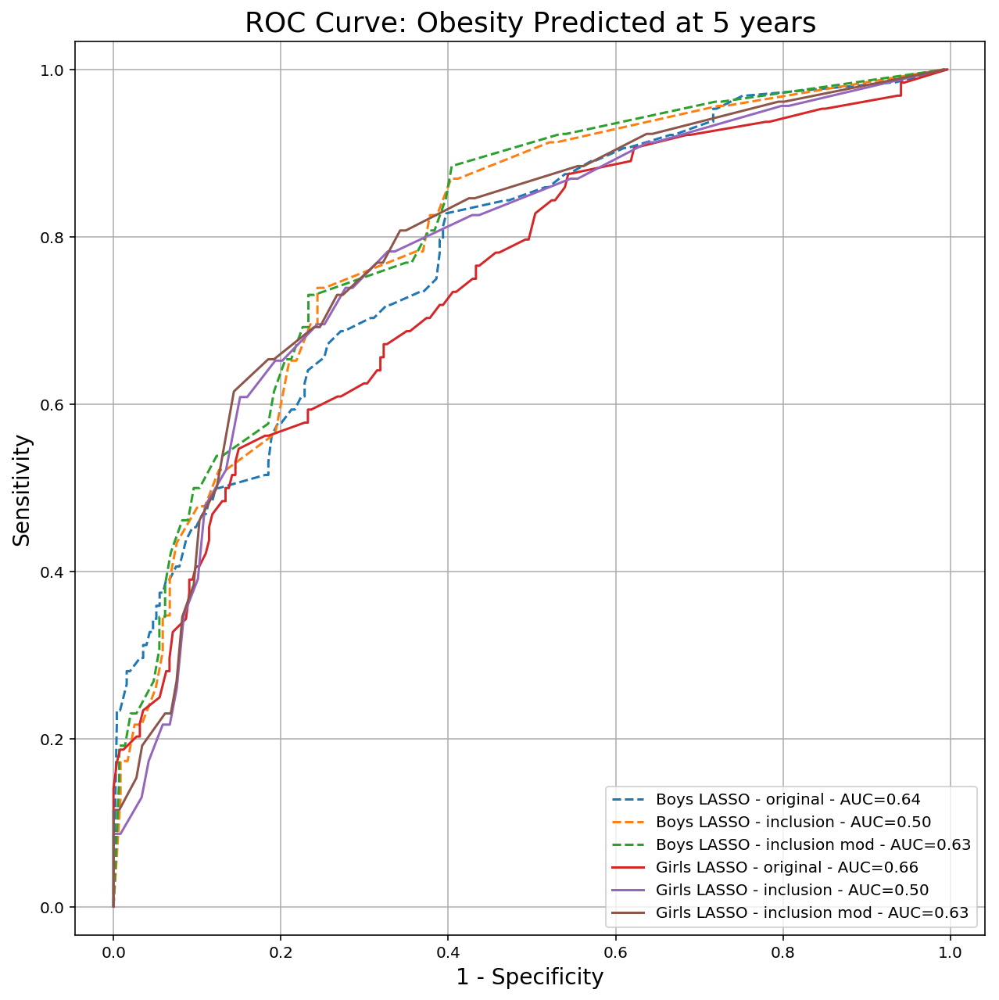

In [38]:
plt.figure(figsize=(9,9))
for i,title in enumerate(titles):
    if 'girls' in titles[i].lower():
        plt.plot(1- np.array(spec_24[i]), np.array(recall_24[i]), linestyle='-', label=title+' - AUC={:0.2f}'.format(auc_list[i][0]))
    else:
        plt.plot(1- np.array(spec_24[i]), np.array(recall_24[i]), linestyle='--', label=title+' - AUC={:0.2f}'.format(auc_list[i][0]))

plt.legend(fontsize = 10)
plt.xlabel('1 - Specificity', fontsize=14)
plt.ylabel('Sensitivity', fontsize=14)
plt.axis('equal')
plt.title('ROC Curve: Obesity Predicted at 5 years', fontsize=18)
plt.grid(True)
plt.tight_layout()
# plt.savefig(newdir+'/Pediatric_Girls_ROC.png', dpi=300)
plt.show()

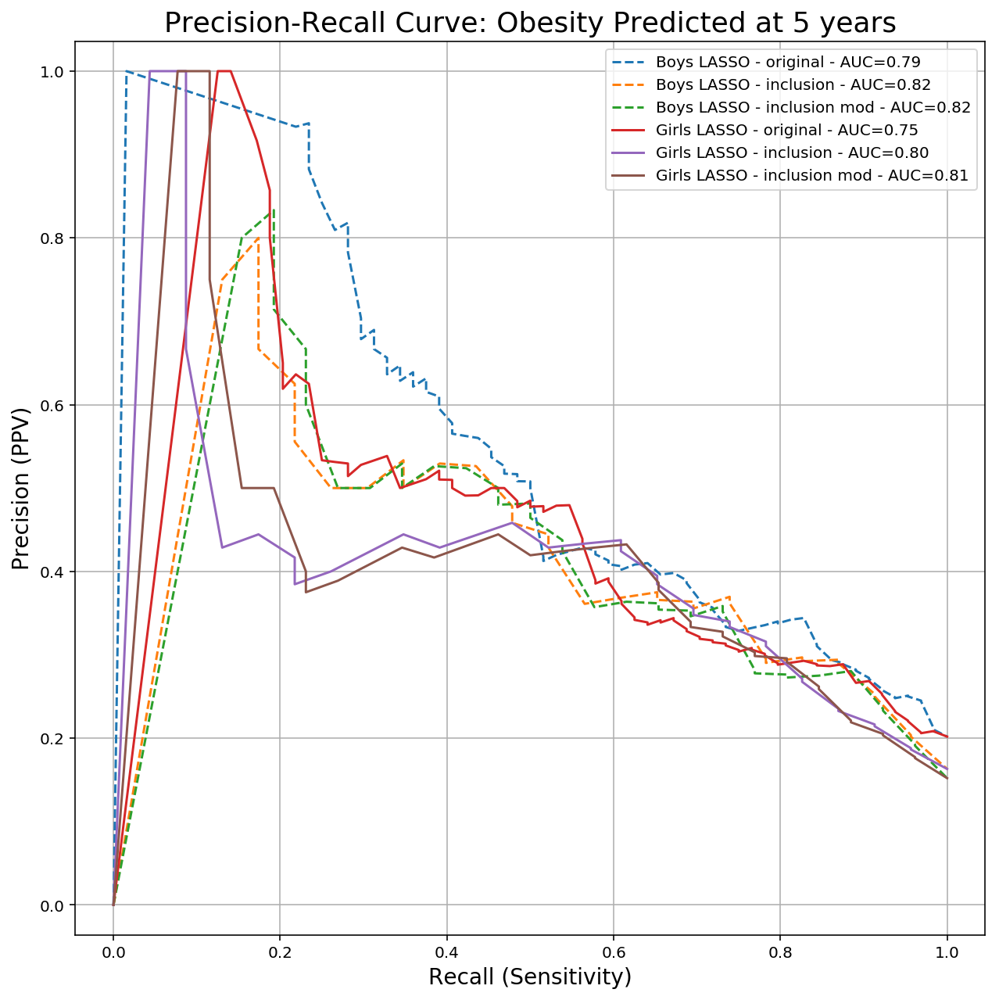

In [39]:
plt.figure(figsize=(9,9))
for i,title in enumerate(titles):
    if 'girls' in titles[i].lower():
        plt.plot(recall_24[i], prec_24[i], linestyle='-', label=titles[i]+' - AUC={:0.2f}'.format(auc_24[i]))
    else:
        plt.plot(recall_24[i], prec_24[i], linestyle='--', label=titles[i]+' - AUC={:0.2f}'.format(auc_24[i]))
plt.xlabel('Recall (Sensitivity)', fontsize=14)
plt.ylabel('Precision (PPV)', fontsize=14)
plt.legend(fontsize = 10)
plt.axis('equal')
plt.title('Precision-Recall Curve: Obesity Predicted at 5 years', fontsize=18)
plt.grid()
plt.tight_layout()
# plt.savefig(newdir+'/Pediatric_Girls_PR.png', dpi=300)
plt.show()

# Next Steps
<ul>
    <li>Rerun analyses at each of the prediction time points with:</li>
    <ul>
        <li>all data</li>
        <li>all data excluding weight and BMI readings</li>
        <li>all data excluding census data</li>
        <li>predict for extreme obesity (99%?)</li>
    </ul>
    <li>Update address data from the most recent data release</li>
    <ul>
        <li>Will need to be geocoded</li>
        <li>Census features for at birth, 2 years old (or month we are predicting from), 1 year before birth?</li>
    </ul>
    <li>Report back on results with cleaned up plots</li>
</ul>